In [3]:
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
import gseapy as gp
from gseapy.plot import gseaplot
import pandas as pd
import requests
from sanbomics.tools import id_map
import sanbomics.tools
import scanpy as sc
import matplotlib.pyplot as plt
from adjustText import adjust_text
import numpy as np
import seaborn as sns
import warnings
warnings.simplefilter('ignore')
from itertools import combinations
# Function to convert Ensembl gene IDs to gene names using the Ensembl REST API
def convert_gene_id_to_name(ensembl_gene_id):
    try:
        # Extract the part of the gene ID before the dot (".")
        gene_id = ensembl_gene_id.split(".")[0]
        
        ensembl_api_url = f"https://rest.ensembl.org/lookup/id/{gene_id}"
        response = requests.get(ensembl_api_url, headers={"Content-Type": "application/json"})

        if response.status_code == 200:
            gene_info = response.json()
            if "display_name" in gene_info:
                gene_name = gene_info["display_name"]
                # print(gene_name)
                return gene_name
            else:
                print('Gene name not found',gene_id)
                return None  # Gene name not found
        else:
            print('Error fetching data from Ensembl')
            return None  # Error fetching data from Ensembl
    except Exception as e:
                    
        print(str(e))

        return None

plt.rcParams["font.family"] = "Century Gothic"
plt.rcParams['font.size'] = 12

In [2]:
counts = pd.read_csv(r"E:\transfer\JC\counts.mm39_reduced_ca.csv")
counts["gene_id"] = counts["gene_id"].apply(lambda x: x.split(".")[0])
# counts['symbol'] = counts["gene_id"].apply(convert_gene_id_to_name)
counts = counts.set_index('gene_id')
metadata = pd.read_csv(r"E:\transfer\JC\metadata.csv")
metadata = metadata.set_index('sample')
infer = pd.read_csv(r"E:\transfer\JC\interferon_genes.csv",low_memory =False)


In [3]:
for col in counts.columns:
    print(col)
    if col not in metadata.index:
        # print("Dropped sale column", col)
        counts = counts.drop(columns=col)
counts = counts.astype(int)
counts = counts[counts.sum(axis = 1) > 0]
# counts = counts.T

JG01
JG02
JG03
JG04
JG05
JG06
JG07
JG08
JG09
JG10
JG11
JG12
JG13
JG14
JG15
JG16
JG17
JG18
JG19
JG20
JG21
JG22
JG23
JG24
JG25
JG26
JG27
JG28
JG29
JG30
JG31
JG32
JG33
JG34
JG35
JG36
JG37
JG38
JG39
JG40
JG41
JG42
JG43
JG44
JG45


(0.0, 0.0015)

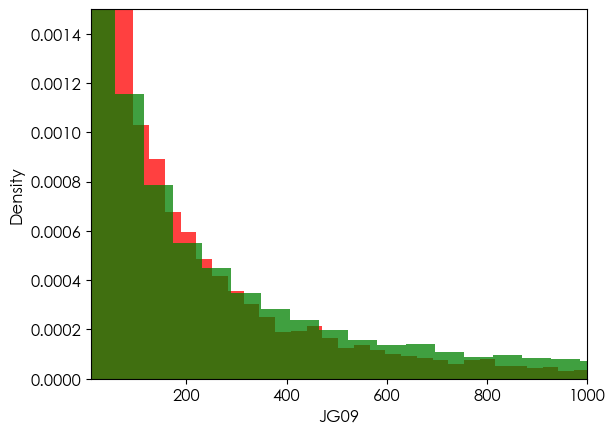

In [51]:
ax =sns.histplot(data= counts,x=counts["JG09"],color = "r",stat = 'density', fill = 1, alpha = 0.75,bins =10000,edgecolor = "none")
ax =sns.histplot(data= counts,x=counts["JG01"],color = "g",stat = 'density', fill = 1, alpha = 0.75,bins =10000,edgecolor = "none")

ax.set_xlim(10,1000)
ax.set_ylim(0,0.0015)

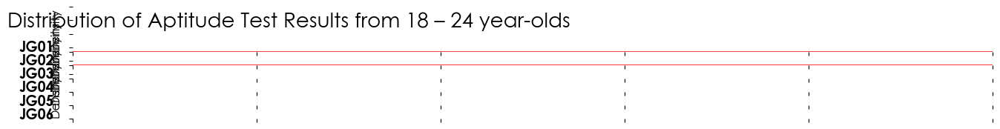

In [58]:
from sklearn.neighbors import KernelDensity

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as grid_spec

countries = [x for x in np.unique(counts.columns)]
colors = ['#0000ff', '#3300cc', '#660099', '#990066', '#cc0033', '#ff0000']
data = counts
gs = grid_spec.GridSpec(len(countries),1)
fig = plt.figure(figsize=(16,9))

i = 0

ax_objs = []
for country in countries[0:6]:
    country = countries[i]
    cx = np.array(data[country])
    # x_d = np.linspace(0,1, 1000)

    # kde = KernelDensity(bandwidth=0.01, kernel='gaussian')
    # kde.fit(x[:, None])

    # logprob = kde.score_samples(x_d[:, None])

    # creating new axes object
    ax_objs.append(fig.add_subplot(gs[i:i+1, 0:]))

    # plotting the distribution
    sns.histplot(x=cx,color = "r",stat = 'density',ax = ax_objs[-1], fill = 1, alpha = 0.75,bins =10000,edgecolor = "k")

    # ax_objs[-1].plot(x_d, np.exp(logprob),color="#f0f0f0",lw=1)
    # ax_objs[-1].fill_between(x_d, np.exp(logprob), alpha=1,color=colors[i])


    # setting uniform x and y lims
    ax_objs[-1].set_xlim(0,1)
    ax_objs[-1].set_ylim(0,2.5)

    # make background transparent
    rect = ax_objs[-1].patch
    rect.set_alpha(0)

    # remove borders, axis ticks, and labels
    ax_objs[-1].set_yticklabels([])

    if i == len(countries)-1:
        ax_objs[-1].set_xlabel("Test Score", fontsize=16,fontweight="bold")
    else:
        ax_objs[-1].set_xticklabels([])

    spines = ["top","right","left","bottom"]
    for s in spines:
        ax_objs[-1].spines[s].set_visible(False)

    adj_country = country.replace(" ","\n")
    ax_objs[-1].text(-0.02,0,adj_country,fontweight="bold",fontsize=14,ha="right")


    i += 1

gs.update(hspace=-0.7)

# fig.text(0.07,0.85,"Distribution of Aptitude Test Results from 18 – 24 year-olds",fontsize=20)

plt.tight_layout()
plt.show()

In [19]:
dds = DeseqDataSet(counts=counts,
            metadata=metadata,
            design_factors=["batch", "condition"])

dds.deseq2()
#design_factors=["batch", "condition"] = ~ batch + condtion

Fitting size factors...
... done in 0.03 seconds.

Fitting dispersions...
... done in 2.09 seconds.

Fitting dispersion trend curve...
... done in 2.94 seconds.

Fitting MAP dispersions...
... done in 2.30 seconds.

Fitting LFCs...
... done in 3.26 seconds.

Refitting 4 outliers.

Fitting dispersions...
... done in 0.00 seconds.

Fitting MAP dispersions...
... done in 0.00 seconds.

Fitting LFCs...
... done in 0.02 seconds.



In [20]:
dds

AnnData object with n_obs × n_vars = 36 × 22186
    obs: 'condition', 'batch'
    uns: 'trend_coeffs', '_squared_logres', 'prior_disp_var'
    obsm: 'design_matrix', 'size_factors', 'replaceable'
    varm: 'non_zero', '_rough_dispersions', 'genewise_dispersions', '_genewise_converged', '_normed_means', 'fitted_dispersions', 'MAP_dispersions', '_MAP_converged', 'dispersions', '_outlier_genes', 'LFC', '_LFC_converged', 'replaced'
    layers: 'normed_counts', '_mu_hat', '_mu_LFC', '_hat_diagonals', 'cooks', 'replace_cooks'

In [10]:
ISG = pd.read_csv(r"E:\transfer\JC\interferon_genes.csv",low_memory =False)
infer = pd.read_csv(r"E:\transfer\JC\interferon_genes.csv",low_memory =False)


In [114]:
test = pd.read_csv(r"E:\transfer\JC\source data for the volcanoplots\de_genes_12h_WT_28C_37C.csv")

In [115]:
test = pd.read_csv(r"E:\transfer\JC\source data for the volcanoplots\de_genes_12h_WT_28C_37C.csv")
df = test.copy()

In [100]:
stat_res_WT

NameError: name 'stat_res_WT' is not defined

In [11]:
def map_color(a):
    log2FoldChange, symbol, nlog10 = a
    if abs(log2FoldChange) < 1 or nlog10 < 1.3:
        return '-'
    if log2FoldChange > 0 and nlog10 > 1.3:
        return 'Λ'
    if log2FoldChange < 0 and nlog10 > 1.3:
        return "V"
    
    return


mapper = id_map(species = 'mouse')

def sexy_volcano(dds,switch,conds,gene_list):
    stat_res_WT = DeseqStats(dds, n_cpus=16, contrast = (switch,conds[0],conds[1]))
    stat_res_WT.summary()
    res_WT = stat_res_WT.results_df
    df = res_WT[res_WT.baseMean >= 10]
    df['symbol'] = df.index.map(mapper.mapper) 
    df['symbol'][0] = "CHIKV-SGc"
    df['symbol'][1] = "CHIKV-SGv"
    ISG = gene_list
    df['nlog10'] = -np.log10(df.padj)
    df['Expression'] = df[['log2FoldChange', 'symbol', 'nlog10']].apply(map_color, axis = 1)

    # df['Gene Type'] = df.symbol.map(map_shape)
    df = find_sig_isgs(df)
    df_new = find_isgs(df)
    # print(len(df_new))
    df = df.sort_values('Gene Type',ascending=False)
    # print(len(gene_list))
    # palt = ['#2d2e2e', '#a31a1a', "#0e2e87"]
    palt = ['#2d2e2e',"#d3a1e6", "#68afed"]
    plt.figure(figsize = (7,7),dpi =600)

    ax = sns.scatterplot(data = df, x = 'log2FoldChange', y = 'nlog10',
                        hue = 'Expression', hue_order = ['-', 'Λ',"V"],
                        palette = palt,
                        style = 'Gene Type', style_order = [ 'Rest','ISG'],
                        markers = [ 'o','*'], 
                        size = "Gene Type",size_order = [ 'Rest','ISG'],
                        sizes = [40,250], linewidths = 0.5,
                        alpha = 1,legend = False)
    
    ax.axhline(1.3, zorder = 0, c = 'k', lw = 2, ls = '--')
    ax.axvline(1, zorder = 0, c = '#909091', lw = 2, ls = '--')
    ax.axvline(-1, zorder = 0, c = '#909091', lw = 2, ls = '--')
    texts = []
    for i in range(len(df)):
        if ((df.iloc[i].nlog10 > 10 and abs(df.iloc[i].log2FoldChange)>1) or (abs(df.iloc[i].log2FoldChange) > 5 and df.iloc[i].nlog10 > 1.3)) and df.iloc[i].symbol in ISG :
            texts.append(plt.text(x = df.iloc[i].log2FoldChange, y = df.iloc[i].nlog10, s = df.iloc[i].symbol,
                                 fontsize = 8, weight = 'bold',ha = "right",ma = "right"))
    texts.append(plt.text(x = df.loc[df["symbol"] == "CHIKV-SGc"]["log2FoldChange"], y = df.loc[df["symbol"] == "CHIKV-SGc"]["nlog10"], s = "CHIKV-SGc",
                                 fontsize = 8, weight = 'bold')) 
    texts.append(plt.text(x = df.loc[df["symbol"] == "CHIKV-SGv"]["log2FoldChange"], y = df.loc[df["symbol"] == "CHIKV-SGv"]["nlog10"], s = "CHIKV-SGc",
                                 fontsize = 8, weight = 'bold')) 
    # texts.append(plt.text(x = df.loc[df["symbol"] == "Bst2"]["log2FoldChange"], y = df.loc[df["symbol"] == "Bst2"]["nlog10"], s = "Bst2",
    #                              fontsize = 8, weight = 'bold')) 
    # texts.append("CHIKV-SGv")
    # leg = ax.legend(loc = "upper center",ncol = 4, frameon = False, prop = {'weight':'regular'}, columnspacing=1,handletextpad = 0.001)
    # leg._legend_box.align = "right"    
    ax.tick_params(width = 2)
    plt.xticks(size = 12, weight = 'regular')
    plt.yticks(size = 12, weight = 'regular')
    # ax.set_ylim(limss[0])
    # ax.set_xlim(limss[1])
    plt.xlabel("$log_{2}$ fold change", size = 15)
    plt.ylabel("-$log_{10}$  $p_{adj}$ value", size = 15)
    ax.set_title(conds[0] + " vs " + conds[1])
    # plt.savefig('volcano.png', dpi = 300, bbox_inches = 'tight', facecolor = 'white')
    plt.tight_layout()
    ax.set_axisbelow(True)
    plt.grid()
    adjust_text(texts, arrowprops = dict(arrowstyle = '-', color = 'k'))
    filename = r'E:\transfer\JC\plots\sexyplots\\' + conds[0] + " vs " + conds[1] +'.png'
    # Create legend
    plt.savefig(filename, dpi = 1200, bbox_inches = 'tight', facecolor = 'white')
    # print(filename)
    plt.show()
    return df_new
def heatplot_wrapper(dds,switch,conds,gene_list):
    stat_res_WT = DeseqStats(dds, n_cpus=16, contrast = (switch,conds[0],conds[1]),quiet=1)

    stat_res_WT.summary()
    # condi = str('condition_'+conds[0]+'_vs_'+ conds[1])
    # try:
    #     stat_res_WT.lfc_shrink(coeff= condi)
    # except:
    #     condi = str('condition_'+conds[1]+'_vs_'+ conds[0])
    #     stat_res_WT.lfc_shrink(coeff= condi)


    res_WT = stat_res_WT.results_df
    df = res_WT[res_WT.baseMean >= 0]
    df['symbol'] = df.index.map(mapper.mapper) 
    ISG = gene_list

    df_new = find_isgs(df)

    return df_new

def find_isgs(df,column2 = "symbol",column3 = "log2FoldChange", value_list =ISG, column = "Gene Type"):
        condition = df[column2].isin(value_list)
        df_new = df[condition][[column2,column3]].copy()
        df_new.set_index(column2, inplace=True)
        df_new.rename(columns={column3: str(conds[0] + " vs " + conds[1])}, inplace=True)
        return df_new


def find_sig_isgs(df, column1 ="nlog10", threshold=1.3, column2 = "symbol",column3 = "log2FoldChange",threshold2 = 1, value_list =ISG, new_column = "Gene Type"):
    df[new_column] = np.where((df[column1] > threshold) & (abs(df[column3]) > threshold2) & df[column2].isin(value_list), 'ISG', 'Rest')
    return df

def map_shape(symbol):
    if symbol in ISG:
        return 'ISG'
    
    return 'Rest'

In [14]:
def sexy_volcano_from_DF(df,gene_list):

    ISG = gene_list
    df['nlog10'] = -np.log10(df.padj)
    df['Expression'] = df[['log2FoldChange', 'symbol', 'nlog10']].apply(map_color, axis = 1)
    # print(df.head())
    # df['Gene Type'] = df.symbol.map(map_shape)
    df = find_sig_isgs(df)
  
    df = df.sort_values('Gene Type',ascending=False)
    # print(df.head())
    # palt = ['#2d2e2e', '#a31a1a', "#0e2e87"]
    # "#015094",'white',"#4f026e" 
    # palt = ['#2d2e2e',"#d3a1e6", "#68afed"]
    palt = ['#2d2e2e',"#4f026e","#015094"]
    plt.figure(figsize = (7,7),dpi =600)

    ax = sns.scatterplot(data = df, x = 'log2FoldChange', y = 'nlog10',
                        hue = 'Expression', hue_order = ['-', 'Λ',"V"],
                        palette = palt,
                        style = 'Gene Type', style_order = [ 'Rest','ISG'],
                        markers = [ "$\circ$","^"], 
                        size = "Gene Type",size_order = [ 'Rest','ISG'],
                        sizes = [60,120], linewidths = 0.5,
                        alpha = 1,legend = False)
    
    ax.axhline(1.3, zorder = 0, c = 'k', lw = 2, ls = '--')
    ax.axvline(1, zorder = 0, c = '#909091', lw = 2, ls = '--')
    ax.axvline(-1, zorder = 0, c = '#909091', lw = 2, ls = '--')
    texts = []
   #  for i in range(len(df)):
   #      try:
   #          if ((df.iloc[i].nlog10 > 10 and abs(df.iloc[i].log2FoldChange)>3) or (abs(df.iloc[i].log2FoldChange) > 5 and df.iloc[i].nlog10 > 5)) and df.iloc[i].symbol in ISG :
   #              texts.append(plt.text(x = df.iloc[i].log2FoldChange, y = df.iloc[i].nlog10, s = df.iloc[i].symbol,
   #                                   fontsize = 11, weight = 'bold',ha = "right",ma = "right"))
   #      except:
   #          print("something be fucked up")
   # # try:
   #      texts.append(plt.text(x = df.loc[df["symbol"] == "CHIKV-SGc"]["log2FoldChange"], y = df.loc[df["symbol"] == "CHIKV-SGc"]["nlog10"], s = "CHIKV-SGc",
   #                                   fontsize = 8, weight = 'bold')) 
   #      texts.append(plt.text(x = df.loc[df["symbol"] == "CHIKV-SGv"]["log2FoldChange"], y = df.loc[df["symbol"] == "CHIKV-SGv"]["nlog10"], s = "CHIKV-SGv",
   #                                   fontsize = 8, weight = 'bold')) 
   #  except:
   #      print("something ain't right" )
    
    ax.tick_params(width = 2)
    plt.xticks(size = 12, weight = 'regular')
    plt.yticks(size = 12, weight = 'regular')
    # ax.set_ylim(limss[0])
    # ax.set_xlim(limss[1])
    plt.xlabel("$log_{2}$ fold change", size = 18)
    plt.ylabel("-$log_{10}$  $p_{adj}$ value", size = 18)
    ax.set_title(filename[9:-4])                        

    # ax.set_title(conds[0] + " vs " + conds[1])
    # plt.savefig('volcano.png', dpi = 300, bbox_inches = 'tight', facecolor = 'white')
    plt.tight_layout()
    ax.set_axisbelow(True)
    plt.grid()
    adjust_text(texts, arrowprops = dict(arrowstyle = '-', color = 'k'))
    outfilename = r'E:\transfer\JC\plots\sexyplots\\' + filename[9:-4] +'.png'
    # Create legend
    plt.savefig(outfilename, dpi = 1200, bbox_inches = 'tight', facecolor = 'white')
    # print(filename)
    plt.show()
    return ax

In [6]:
import os
os.listdir(r"E:\transfer\JC\source data for the volcanoplots\\")


['de_genes_12h_WT_28C_37C.csv',
 'de_genes_24h_WT_28C_37C.csv',
 'de_genes_28C_12h_WT_GAA.csv',
 'de_genes_28C_24h_WT_GAA.csv',
 'de_genes_37C_12h_WT_GAA.csv',
 'de_genes_37C_24h_WT_GAA.csv',
 'de_genes_GAA_12h_28C_37C.csv',
 'de_genes_GAA_24h_28C_37C.csv']

In [4]:
from itertools import combinations
import itertools
import time

from numba import jit


[1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
[1, 3, 6, 10, 15, 21, 28, 36, 45, 55]
[1, 4, 10, 20, 35, 56, 84, 120, 165, 220]
[1, 5, 15, 35, 70, 126, 210, 330, 495, 715]
[1, 6, 21, 56, 126, 252, 462, 792, 1287, 2002]


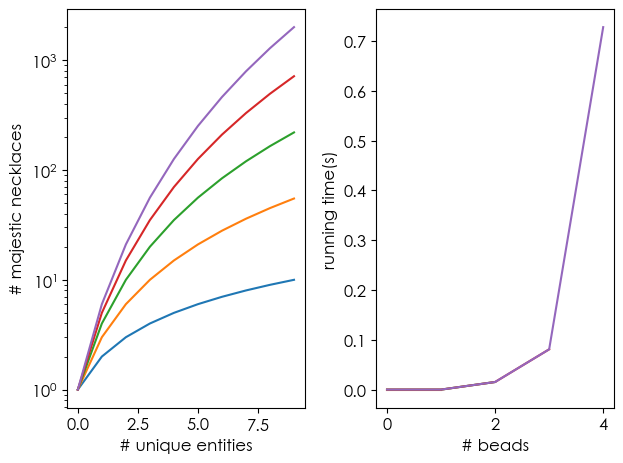

In [20]:
temps = []
fig,axes = plt.subplots(1,2, dpi = 100)
axes= axes.flatten()
for beads in range(1,6):
    res = []
    t_c  = time.time()
    for ups in range(1,11):
        lower =0
     
        cur= []
        maj = []
        combs = list(itertools.product(range(lower,ups), repeat=beads))
        pp=0
        
        for li in combs:
            # li= list(li)
            # print(pp)
            for jj in range(len(li)):
                # print(pp)
                if any(y > li[jj] for y in li[jj:]):
                    # print("elements remaining", len(li)-jj)
        
                    break
                else:
                    # print("elements remaining", len(li)-jj)
                    if jj< len(li)-1:
                        continue
                # print(li)
                pp+=1
        res.append(pp)
    t_f = time.time()
    t_o = t_f-t_c
    # print(t_o,"%f00000.1")
    temps.append(t_o)
        # print(f"number of majestic beads for {ups} is:{pp}")
    print(res)
   
    sns.lineplot(res,ax = axes[0])
    axes[0].set_yscale("log")
    axes[0].set_xlabel("# unique entities")
    axes[1].set_xlabel("# beads")
    axes[0].set_ylabel("# majestic necklaces")
    axes[1].set_ylabel("running time(s)")
    ax2=sns.lineplot(temps,ax =axes[1])
    # axes[1].set_yscale("log")
fig.tight_layout()

In [33]:
import math

n = 10  # number of bins
r = 100 # number of items

# Calculate (n + r - 1) choose r
num_necklaces = math.comb(n + r - 1, r)

print(num_necklaces)

4263421511271


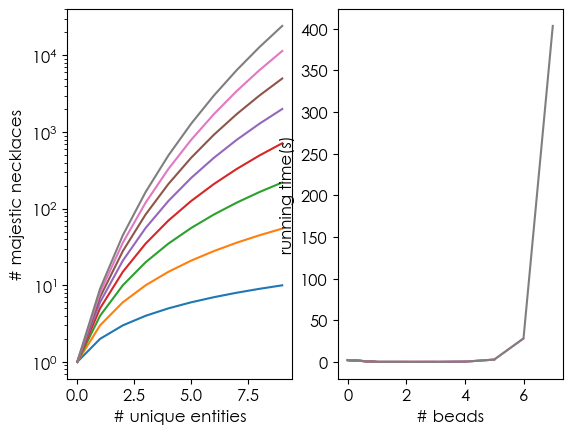

In [164]:
temps = []
@jit(nopython=True)
def sexylist(li):
    divmodd = 0
    for jj in range(len(li)):
        flag = False
        for y in li[jj+1:]:
            if y > li[jj]:
                flag = True
                break
        if flag:
            break
        else:
            if jj < len(li) - 1:
                continue
        dd = 1
    return dd
fig,axes = plt.subplots(1,2, dpi = 100)
axes= axes.flatten()
for beads in range(1,9):
    res = []
    t_c  = time.time()
    for ups in range(1,11):
        lower =0
     
        cur= []
        maj = []
        combs = np.stack(np.array(list(itertools.product(range(lower,ups), repeat=beads))))
        pp=0
        

        
        for li in combs:
            dd= sexylist(li)
            pp= pp+dd
        res.append(pp)
    t_f = time.time()
    t_o = t_f-t_c
    # print(t_o,"%f00000.1")
    temps.append(t_o)
        # print(f"number of majestic beads for {ups} is:{pp}")
    # print(res)
   
    sns.lineplot(res,ax = axes[0])
    axes[0].set_yscale("log")
    axes[0].set_xlabel("# unique entities")
    axes[1].set_xlabel("# beads")
    axes[0].set_ylabel("# majestic necklaces")
    axes[1].set_ylabel("running time(s)")
    ax2=sns.lineplot(temps,ax =axes[1])
    # axes[1].set_yscale("log")


In [138]:
np.stack(combs)

array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 2],
       ...,
       [4, 4, 4, 4, 2],
       [4, 4, 4, 4, 3],
       [4, 4, 4, 4, 4]])

In [111]:
import numpy as np
N = 10000
vect = np.arange(float(N))
vect[N//2] = 1
vect[N//4] = 1
dupl = []
print("init done")
counter = 0
for i in range(N):
    for j in range(i+1, N):
        if vect[i] == vect[j]:
            dupl.append(j)
            counter += 1

print("counter =", counter)
print(dupl)

init done
counter = 3
[2500, 5000, 5000]


In [116]:

N = 10000
vect = np.arange(N, dtype=np.float32)

vect[N//2] = 1
vect[N//4] = 1
dupl = np.zeros(N, dtype=np.int32)

print("init done")
# uncomment to enable compiled function
@jit
def duplicates(i, counter, dupl, vect):
    eps = 0.01
    ns = len(vect)
    for j in range(i+1, ns):
        # replace if to use approx comparison
        #if abs(vect[i] - vect[j]) < eps:
        if vect[i] == vect[j]:
            dupl[counter] = j
            counter += 1
    return counter

counter = 0
for i in range(N):
    counter = duplicates(i, counter, dupl, vect)

print("counter =", counter)
print(dupl[0:counter])

init done
counter = 3
[2500 5000 5000]


In [ ]:
[(0, 0, 0),
 (0, 0, 1),
 (0, 0, 2),
 (0, 1, 0),
 (0, 1, 1),
 (0, 1, 2),
 (0, 2, 0),
 (0, 2, 1),
 (0, 2, 2),
 (1, 0, 0),
 (1, 0, 1),
 (1, 0, 2),
 (1, 1, 0),
 (1, 1, 1),
 (1, 1, 2),
 (1, 2, 0),
 (1, 2, 1),
 (1, 2, 2),
 (2, 0, 0),
 (2, 0, 1),
 (2, 0, 2),
 (2, 1, 0),
 (2, 1, 1),
 (2, 1, 2),
 (2, 2, 0),
 (2, 2, 1),
 (2, 2, 2)]

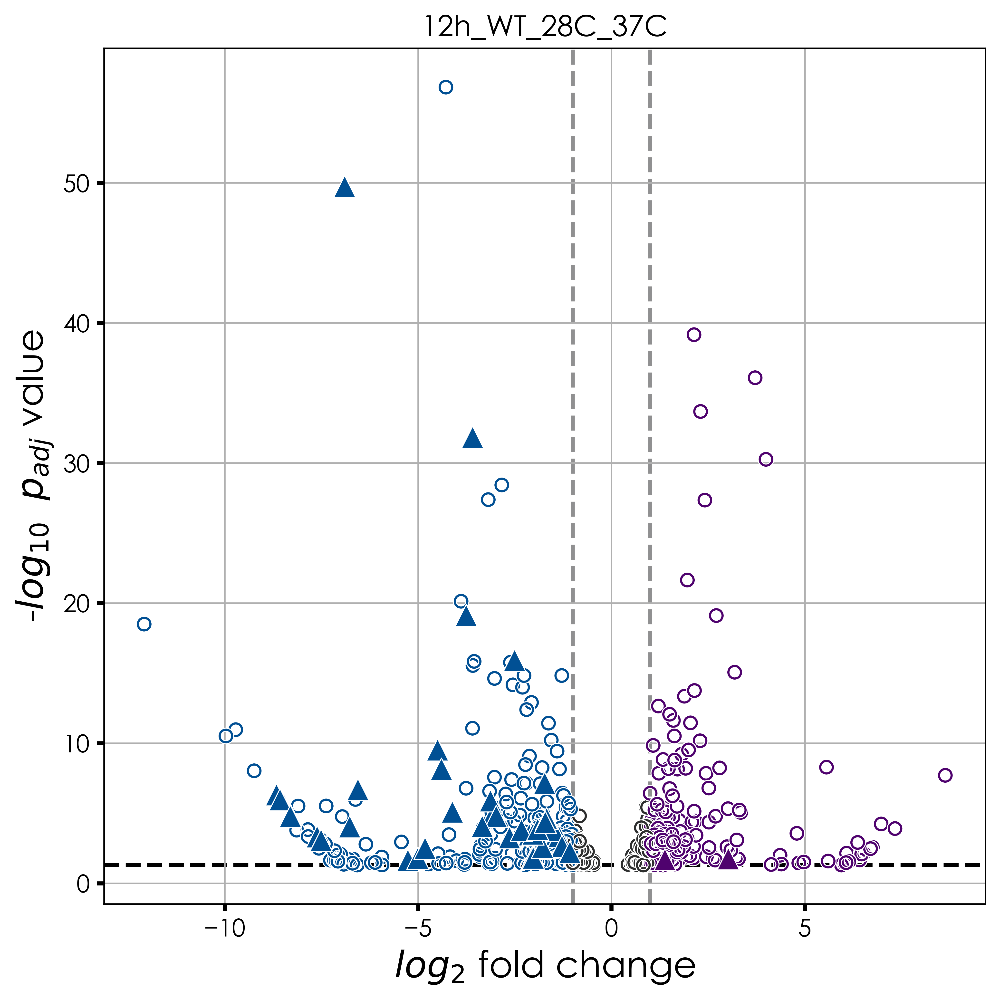

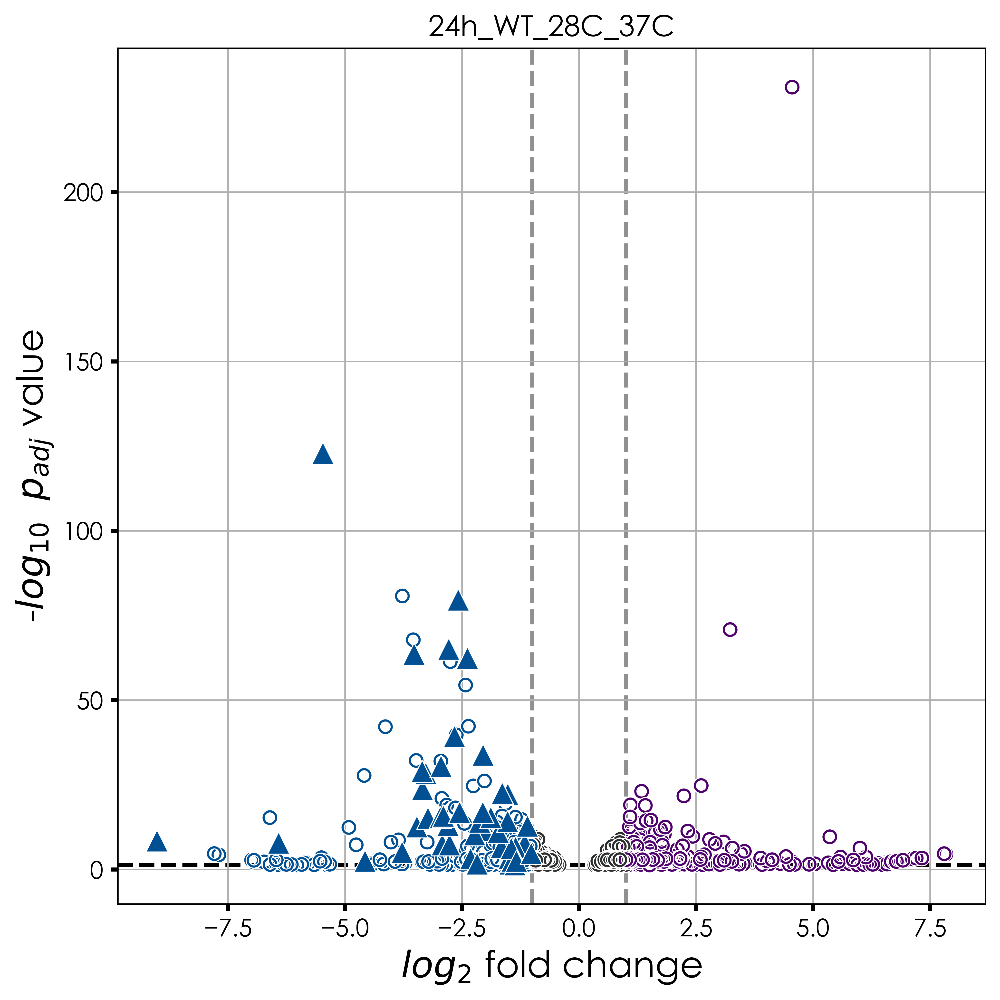

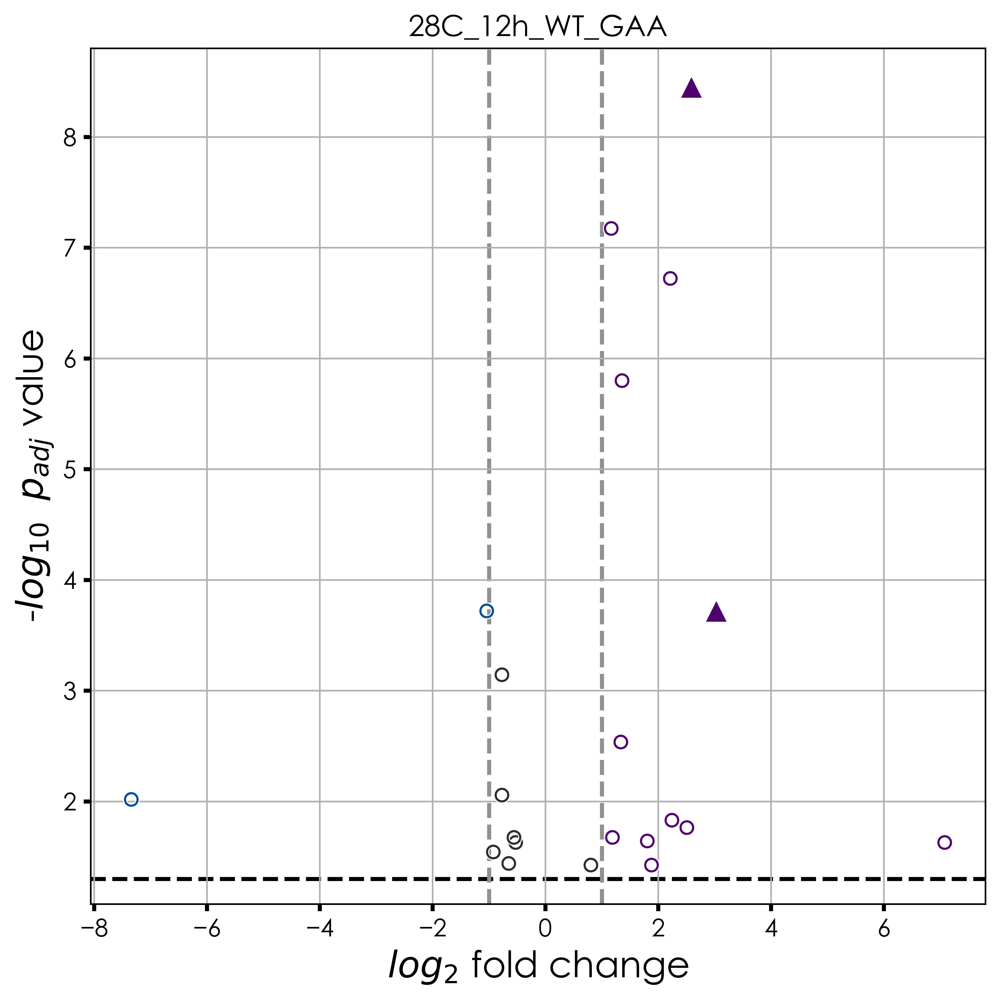

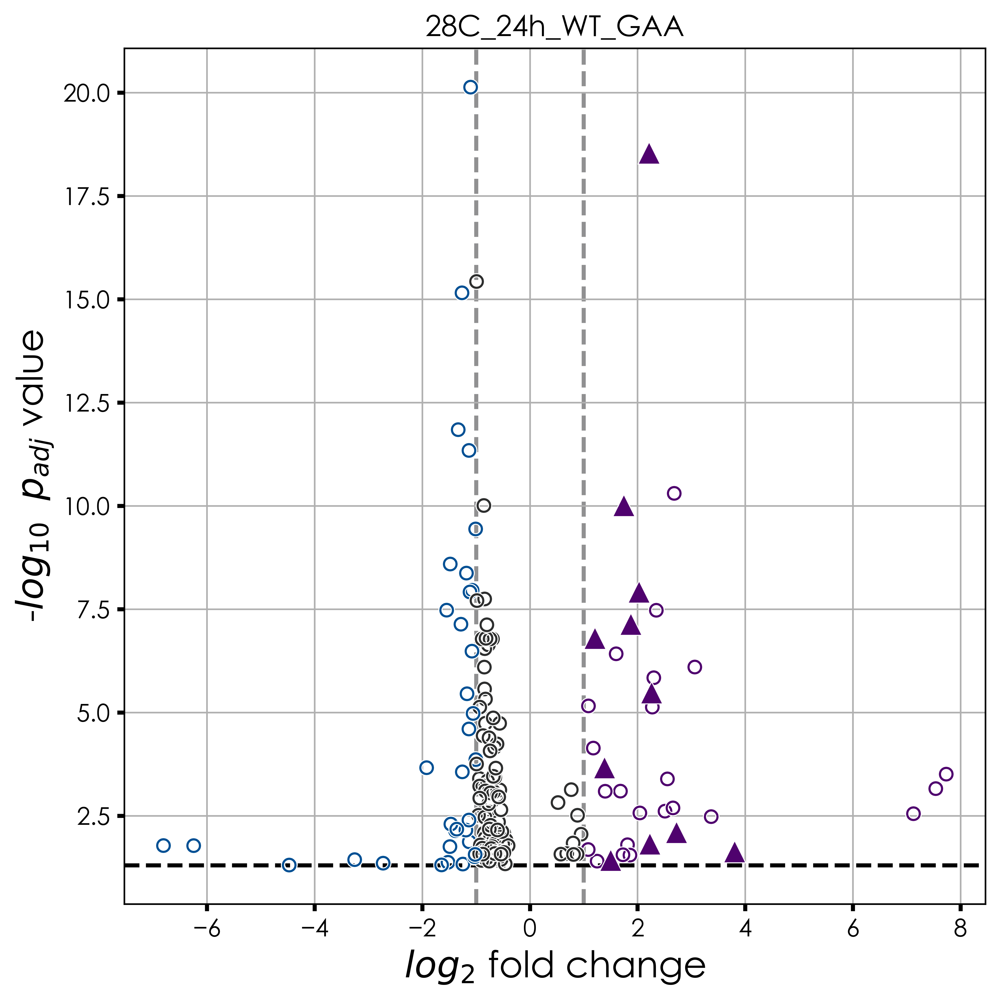

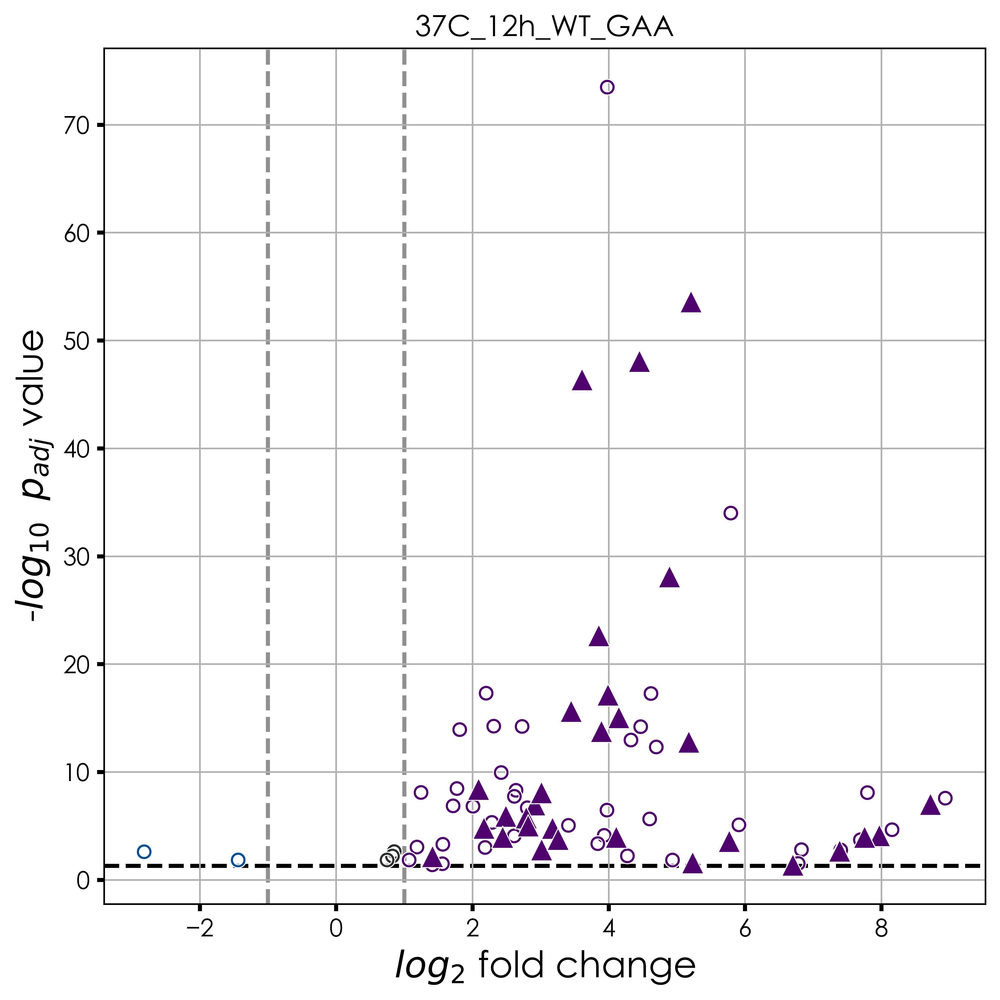

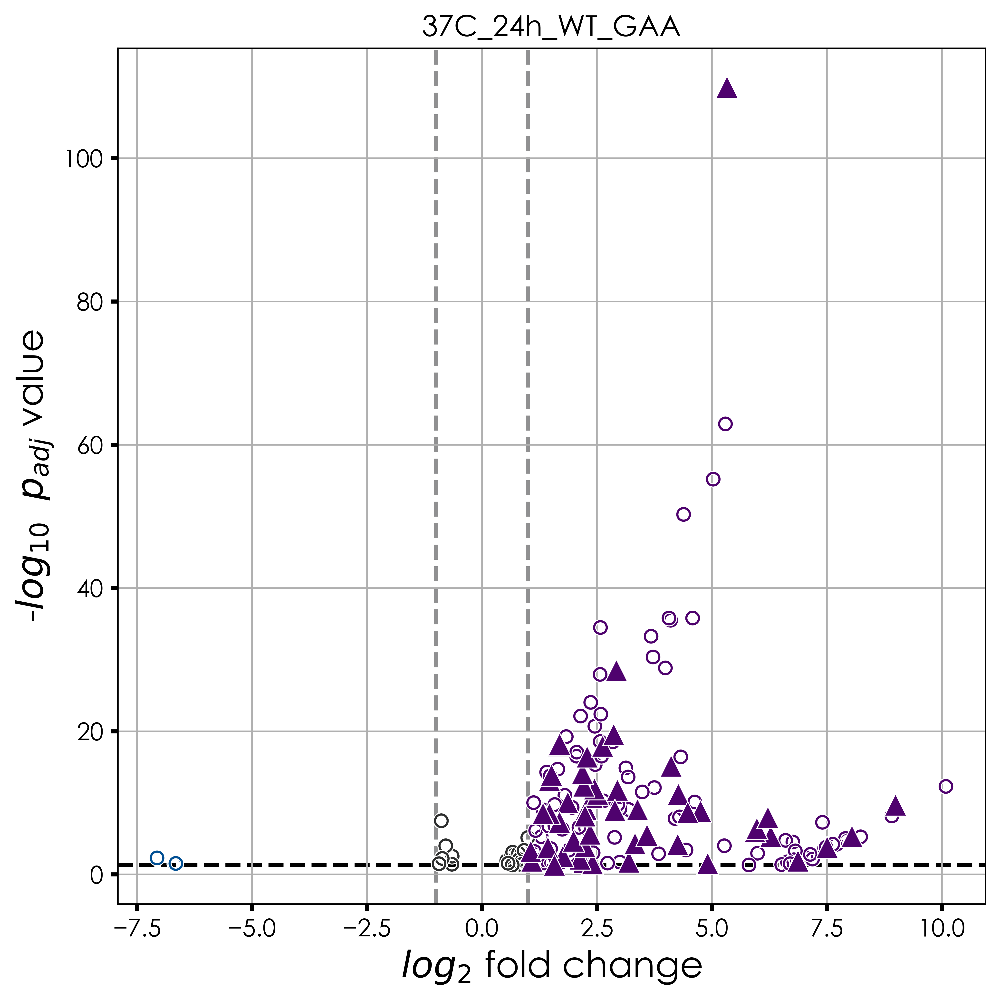

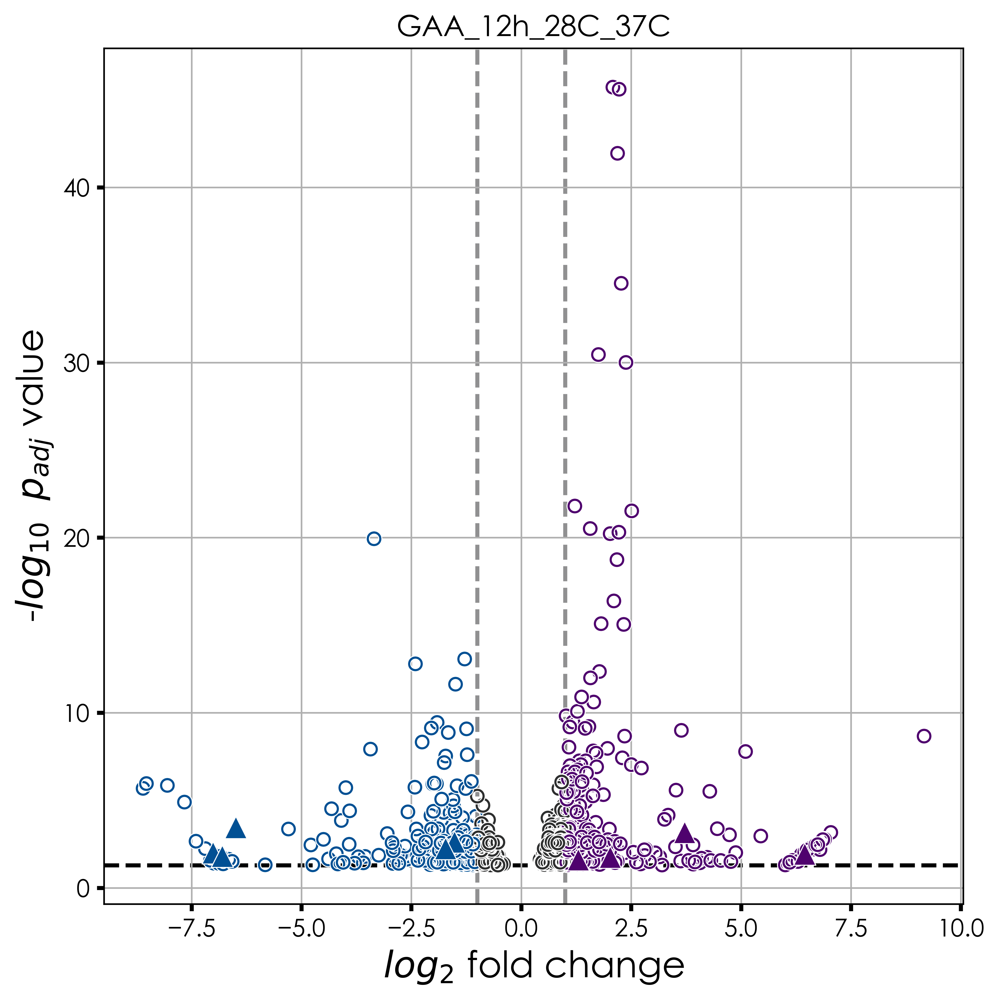

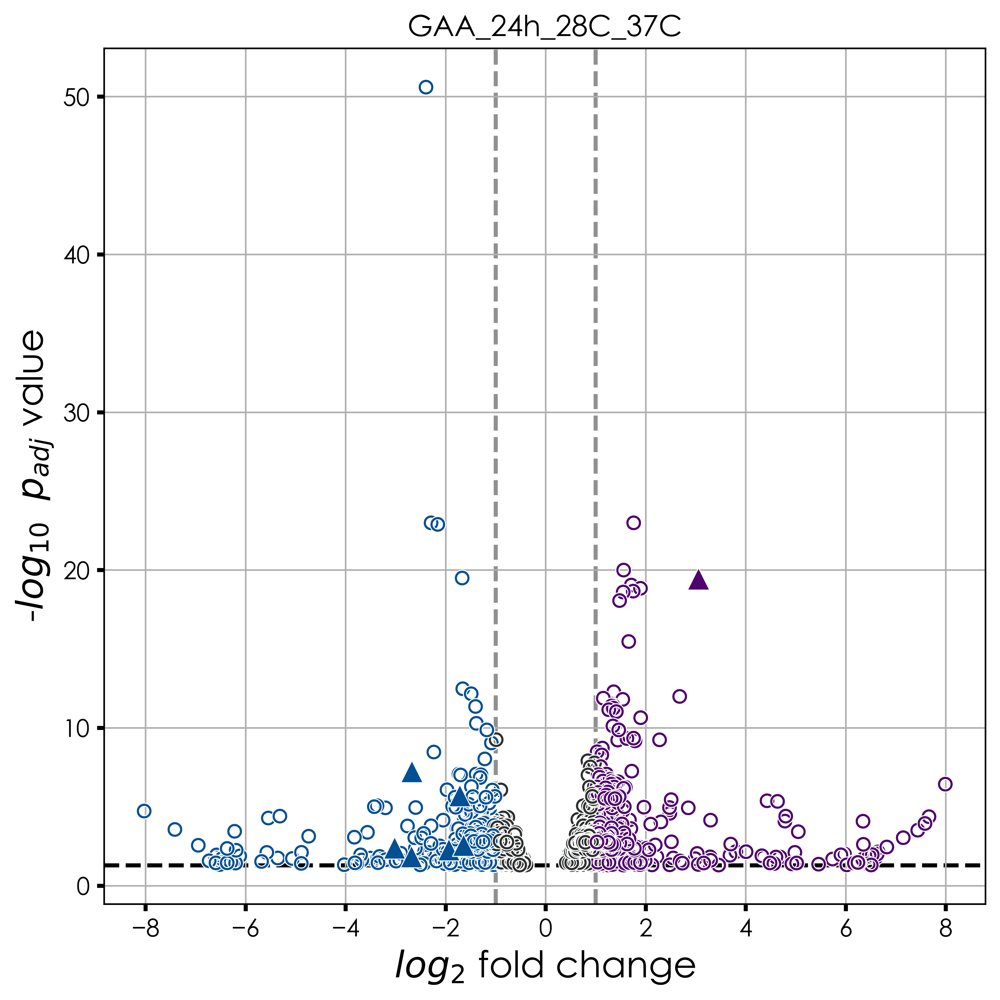

In [15]:

for filename in os.listdir(r"E:\transfer\JC\source data for the volcanoplots\\"):
    file = str(r"E:\transfer\JC\source data for the volcanoplots\\" + filename)
    # print(file)
    test = pd.read_csv(file)
    df = test.copy()
    ax = sexy_volcano_from_DF(df,infer)
    del test
    del df

<Axes: xlabel='log2FoldChange', ylabel='nlog10'>

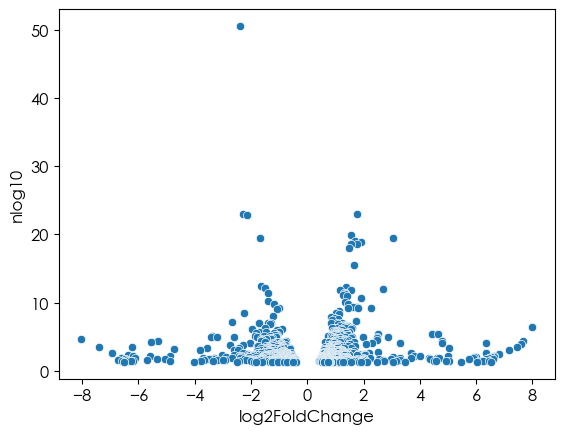

In [142]:
sns.scatterplot(x = df.log2FoldChange,y =df["nlog10"])

Running Wald tests...


Log2 fold change & Wald test p-value: condition 28C-12h-GAA vs 37C-12h-GAA


... done in 1.20 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_id,,,,,,
CHIKV-SGc,2085.921677,0.428050,0.448426,0.954561,0.339800,0.646739
CHIKV-SGv,118561.097281,1.130800,0.591704,1.911091,0.055993,0.245422
ENSMUSG00000000001,2424.691841,0.384738,0.149627,2.571321,0.010131,0.081734
ENSMUSG00000000028,288.282649,-0.206869,0.265461,-0.779284,0.435812,0.722137
ENSMUSG00000000031,6.155494,4.645834,2.811244,1.652590,0.098414,NaN
...,...,...,...,...,...,...
ENSMUSG00002076867,0.389496,-0.853570,7.411727,-0.115165,0.908315,NaN
ENSMUSG00002076935,0.512486,-5.174199,7.349708,-0.704001,0.481432,NaN
ENSMUSG00002076975,1.502255,-1.702256,5.110461,-0.333092,0.739065,NaN


81
0


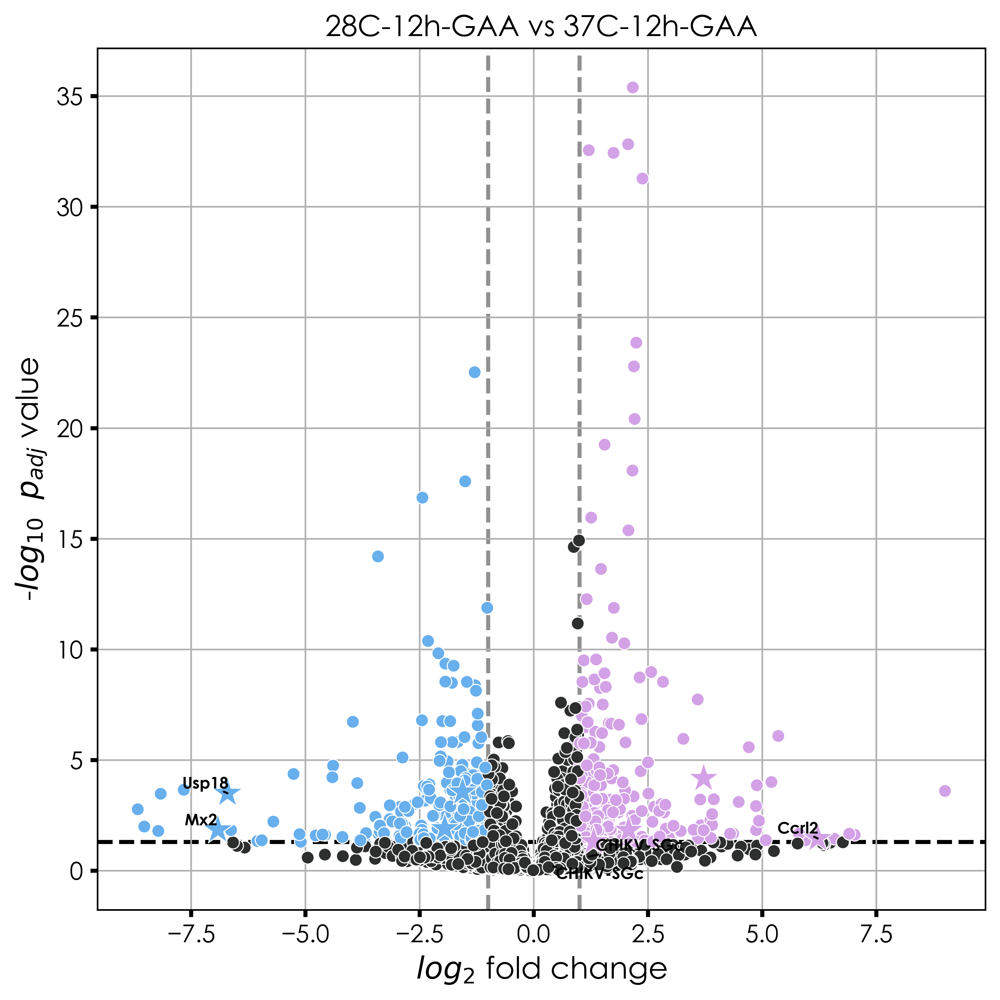

In [23]:
for conds in condss:
    sexy_volcano(dds,"condition",conds,infer)
    break

In [516]:
import os
bisk = os.listdir(r"E:\transfer\JC\plots\sexyplots\Useful\\")

In [598]:
condss

[['28C-12h-GAA', '37C-12h-GAA'],
 ['28C-12h-WT', '28C-12h-GAA'],
 ['28C-12h-WT', '37C-12h-WT'],
 ['28C-24h-GAA', '37C-24h-GAA'],
 ['28C-24h-WT', '28C-24h-GAA'],
 ['28C-24h-WT', '37C-24h-WT'],
 ['37C-12h-WT', '37C-12h-GAA'],
 ['37C-24h-WT', '37C-24h-GAA']]

In [10]:
# condss=[]
# for bee in bisk:

#     cond1 = bee[8:19]
#     cond2 = bee[23:34]
#     condss.append([cond1,cond2])
# print(condss)
condss =[['28C-12h-GAA', '37C-12h-GAA'], ['28C-12h-WT', '28C-12h-GAA'], ['28C-12h-WT', '37C-12h-WT'], ['28C-24h-GAA', '37C-24h-GAA'], ['28C-24h-WT', '28C-24h-GAA'], ['28C-24h-WT', '37C-24h-WT'], ['37C-12h-WT', '37C-12h-GAA'], ['37C-24h-WT', '37C-24h-GAA']]

Running Wald tests...


Log2 fold change & Wald test p-value: condition 28C-12h-GAA vs 37C-12h-GAA


... done in 2.93 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_id,,,,,,
CHIKV-SGc,2085.921677,0.428050,0.448426,0.954561,0.339800,0.646739
CHIKV-SGv,118561.097281,1.130800,0.591704,1.911091,0.055993,0.245422
ENSMUSG00000000001,2424.691841,0.384738,0.149627,2.571321,0.010131,0.081734
ENSMUSG00000000028,288.282649,-0.206869,0.265461,-0.779284,0.435812,0.722137
ENSMUSG00000000031,6.155494,4.645834,2.811244,1.652590,0.098414,NaN
...,...,...,...,...,...,...
ENSMUSG00002076867,0.389496,-0.853570,7.411727,-0.115165,0.908315,NaN
ENSMUSG00002076935,0.512486,-5.174199,7.349708,-0.704001,0.481432,NaN
ENSMUSG00002076975,1.502255,-1.702256,5.110461,-0.333092,0.739065,NaN


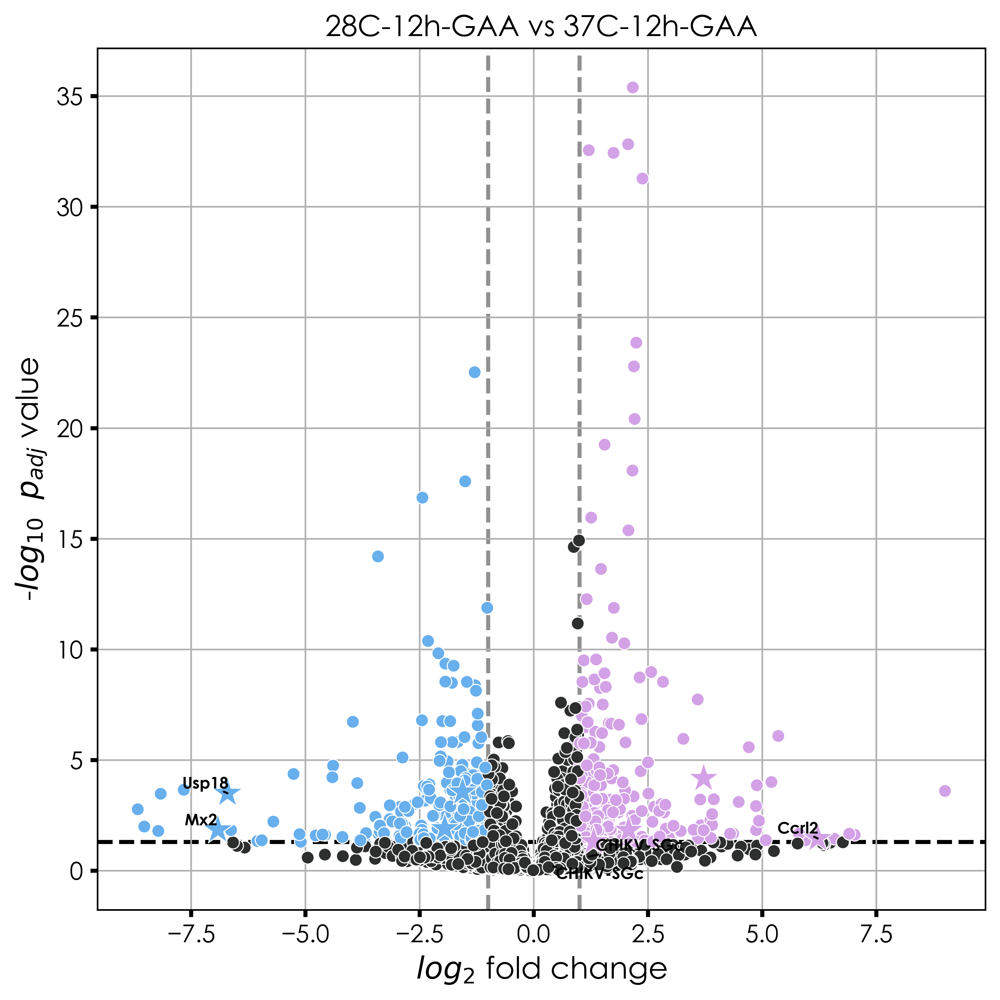

Running Wald tests...


Log2 fold change & Wald test p-value: condition 28C-12h-WT vs 28C-12h-GAA


... done in 0.95 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_id,,,,,,
CHIKV-SGc,2085.921677,0.559726,0.447796,1.249956,0.211316,0.999638
CHIKV-SGv,118561.097281,0.542039,0.591685,0.916093,0.359618,0.999638
ENSMUSG00000000001,2424.691841,-0.213344,0.148795,-1.433811,0.151626,0.999638
ENSMUSG00000000028,288.282649,0.162226,0.262712,0.617504,0.536903,0.999638
ENSMUSG00000000031,6.155494,-4.656732,2.501093,-1.861878,0.062620,NaN
...,...,...,...,...,...,...
ENSMUSG00002076867,0.389496,1.768762,7.223591,0.244859,0.806565,NaN
ENSMUSG00002076935,0.512486,-0.043697,7.594443,-0.005754,0.995409,NaN
ENSMUSG00002076975,1.502255,-2.999568,5.444798,-0.550905,0.581699,NaN


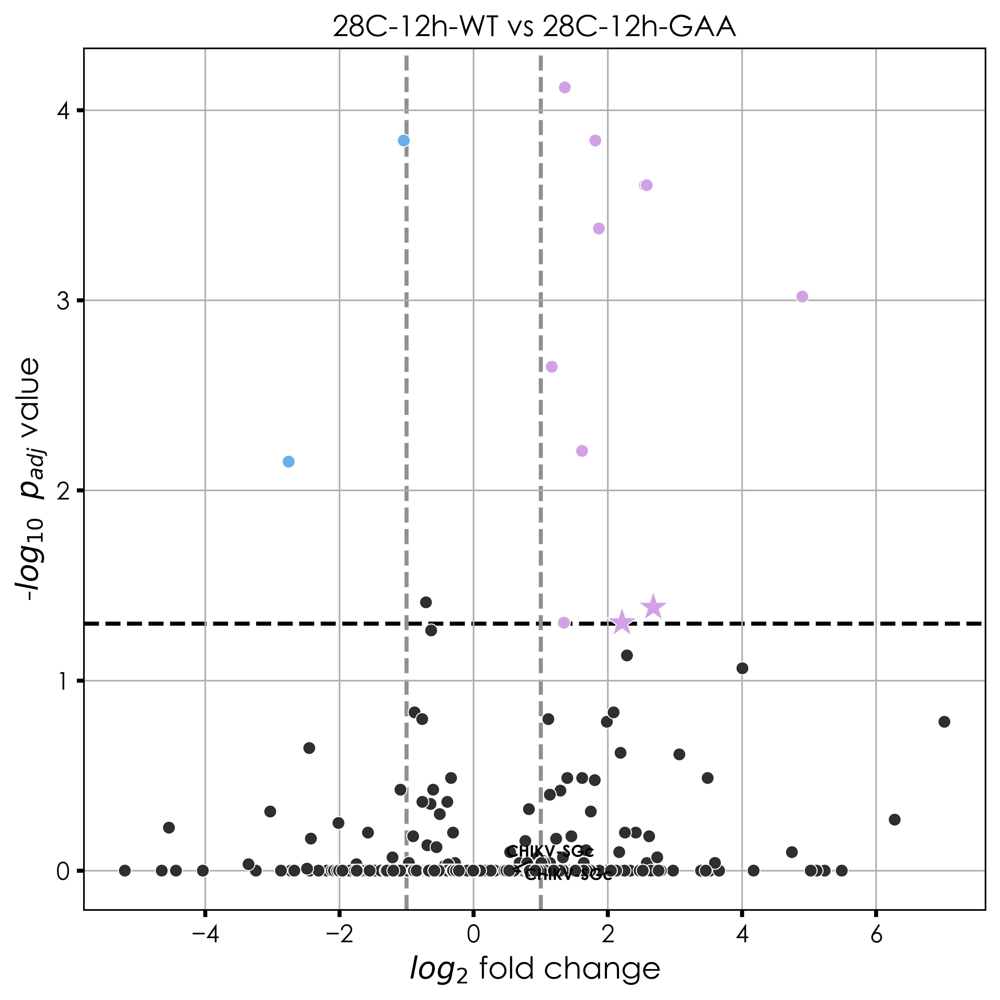

In [28]:
for conds in condss[0:2]:
    try:
        ff = ff.merge(sexy_volcano(dds,"condition",conds,infer), left_index=True, right_index=True)
    except:
        ff = sexy_volcano(dds,"condition",conds,infer)

In [55]:
del ff
condiss = [['28C-12h-GAA', '37C-12h-GAA'],['28C-12h-WT', '37C-12h-WT'],['28C-12h-WT', '28C-12h-GAA'],['37C-12h-WT', '37C-12h-GAA'],
          ['28C-24h-GAA', '37C-24h-GAA'],['28C-24h-WT', '37C-24h-WT'],['28C-24h-WT', '28C-24h-GAA'], ['37C-24h-WT', '37C-24h-GAA']]
for conds in condiss:
    try:
        ff = ff.merge(heatplot_wrapper(dds,"condition",conds,infer), left_index=True, right_index=True)
    except:
        ff = heatplot_wrapper(dds,"condition",conds,infer)

Log2 fold change & Wald test p-value: condition 28C-12h-GAA vs 37C-12h-GAA


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_id,,,,,,
CHIKV-SGc,2085.921677,0.428050,0.448426,0.954561,0.339800,0.646739
CHIKV-SGv,118561.097281,1.130800,0.591704,1.911091,0.055993,0.245422
ENSMUSG00000000001,2424.691841,0.384738,0.149627,2.571321,0.010131,0.081734
ENSMUSG00000000028,288.282649,-0.206869,0.265461,-0.779284,0.435812,0.722137
ENSMUSG00000000031,6.155494,4.645834,2.811244,1.652590,0.098414,NaN
...,...,...,...,...,...,...
ENSMUSG00002076867,0.389496,-0.853570,7.411727,-0.115165,0.908315,NaN
ENSMUSG00002076935,0.512486,-5.174199,7.349708,-0.704001,0.481432,NaN
ENSMUSG00002076975,1.502255,-1.702256,5.110461,-0.333092,0.739065,NaN


Log2 fold change & Wald test p-value: condition 28C-12h-WT vs 37C-12h-WT


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_id,,,,,,
CHIKV-SGc,2085.921677,0.721934,0.448191,1.610774,0.107229,0.365192
CHIKV-SGv,118561.097281,0.933129,0.591694,1.577048,0.114785,0.378193
ENSMUSG00000000001,2424.691841,0.095568,0.149685,0.638462,0.523173,0.795721
ENSMUSG00000000028,288.282649,-0.303686,0.264211,-1.149404,0.250390,0.571740
ENSMUSG00000000031,6.155494,-2.508112,2.623176,-0.956136,0.339004,NaN
...,...,...,...,...,...,...
ENSMUSG00002076867,0.389496,0.843144,7.222789,0.116734,0.907071,NaN
ENSMUSG00002076935,0.512486,-0.969404,7.592425,-0.127680,0.898402,NaN
ENSMUSG00002076975,1.502255,-3.111091,5.479891,-0.567729,0.570219,NaN


Log2 fold change & Wald test p-value: condition 28C-12h-WT vs 28C-12h-GAA


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_id,,,,,,
CHIKV-SGc,2085.921677,0.559726,0.447796,1.249956,0.211316,0.999638
CHIKV-SGv,118561.097281,0.542039,0.591685,0.916093,0.359618,0.999638
ENSMUSG00000000001,2424.691841,-0.213344,0.148795,-1.433811,0.151626,0.999638
ENSMUSG00000000028,288.282649,0.162226,0.262712,0.617504,0.536903,0.999638
ENSMUSG00000000031,6.155494,-4.656732,2.501093,-1.861878,0.062620,NaN
...,...,...,...,...,...,...
ENSMUSG00002076867,0.389496,1.768762,7.223591,0.244859,0.806565,NaN
ENSMUSG00002076935,0.512486,-0.043697,7.594443,-0.005754,0.995409,NaN
ENSMUSG00002076975,1.502255,-2.999568,5.444798,-0.550905,0.581699,NaN


Log2 fold change & Wald test p-value: condition 37C-12h-WT vs 37C-12h-GAA


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_id,,,,,,
CHIKV-SGc,2085.921677,0.265842,0.448820,0.592314,0.553641,0.916793
CHIKV-SGv,118561.097281,0.739709,0.591712,1.250117,0.211257,0.745397
ENSMUSG00000000001,2424.691841,0.075826,0.150512,0.503788,0.614410,0.937706
ENSMUSG00000000028,288.282649,0.259042,0.266945,0.970395,0.331850,0.828563
ENSMUSG00000000031,6.155494,2.497215,2.920695,0.855007,0.392547,NaN
...,...,...,...,...,...,...
ENSMUSG00002076867,0.389496,0.072048,7.410893,0.009722,0.992243,NaN
ENSMUSG00002076935,0.512486,-4.248493,7.347546,-0.578219,0.563116,NaN
ENSMUSG00002076975,1.502255,-1.590732,5.147883,-0.309007,0.757316,NaN


Log2 fold change & Wald test p-value: condition 28C-24h-GAA vs 37C-24h-GAA


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_id,,,,,,
CHIKV-SGc,2085.921677,1.934836,0.448387,4.315106,1.595261e-05,4.737389e-04
CHIKV-SGv,118561.097281,4.120526,0.591727,6.963556,3.317890e-12,7.015346e-10
ENSMUSG00000000001,2424.691841,0.374581,0.149459,2.506247,1.220204e-02,7.706313e-02
ENSMUSG00000000028,288.282649,-0.524469,0.265306,-1.976845,4.805914e-02,1.957169e-01
ENSMUSG00000000031,6.155494,-2.324829,2.078999,-1.118244,2.634627e-01,NaN
...,...,...,...,...,...,...
ENSMUSG00002076867,0.389496,-0.025583,7.149759,-0.003578,9.971450e-01,NaN
ENSMUSG00002076935,0.512486,-0.112683,7.602309,-0.014822,9.881740e-01,NaN
ENSMUSG00002076975,1.502255,-4.598386,5.411575,-0.849731,3.954744e-01,NaN


Log2 fold change & Wald test p-value: condition 28C-24h-WT vs 37C-24h-WT


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_id,,,,,,
CHIKV-SGc,2085.921677,3.221765,0.447950,7.192236,6.373876e-13,1.246201e-10
CHIKV-SGv,118561.097281,4.571677,0.591693,7.726436,1.105995e-14,3.687322e-12
ENSMUSG00000000001,2424.691841,0.949137,0.149335,6.355767,2.073894e-10,2.716308e-08
ENSMUSG00000000028,288.282649,-0.532703,0.263189,-2.024034,4.296668e-02,1.852349e-01
ENSMUSG00000000031,6.155494,-4.088474,2.320285,-1.762057,7.805974e-02,NaN
...,...,...,...,...,...,...
ENSMUSG00002076867,0.389496,-0.068378,7.156948,-0.009554,9.923771e-01,NaN
ENSMUSG00002076935,0.512486,-0.094291,7.589035,-0.012425,9.900868e-01,NaN
ENSMUSG00002076975,1.502255,1.251949,5.553677,0.225427,8.216471e-01,NaN


Log2 fold change & Wald test p-value: condition 28C-24h-WT vs 28C-24h-GAA


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_id,,,,,,
CHIKV-SGc,2085.921677,1.609099,0.447520,3.595590,0.000324,0.018320
CHIKV-SGv,118561.097281,1.849595,0.591680,3.126006,0.001772,0.060454
ENSMUSG00000000001,2424.691841,0.275489,0.148924,1.849864,0.064333,0.540376
ENSMUSG00000000028,288.282649,0.070457,0.265772,0.265104,0.790929,0.986845
ENSMUSG00000000031,6.155494,-3.078494,2.341998,-1.314473,0.188687,NaN
...,...,...,...,...,...,...
ENSMUSG00002076867,0.389496,-0.237284,7.152655,-0.033174,0.973536,NaN
ENSMUSG00002076935,0.512486,-0.176097,7.604668,-0.023156,0.981525,NaN
ENSMUSG00002076975,1.502255,1.170142,5.543864,0.211070,0.832833,NaN


Log2 fold change & Wald test p-value: condition 37C-24h-WT vs 37C-24h-GAA


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_id,,,,,,
CHIKV-SGc,2085.921677,0.322170,0.448816,0.717821,0.472868,0.999963
CHIKV-SGv,118561.097281,1.398443,0.591740,2.363272,0.018114,0.538622
ENSMUSG00000000001,2424.691841,-0.299066,0.149868,-1.995525,0.045986,0.784146
ENSMUSG00000000028,288.282649,0.078691,0.262724,0.299520,0.764543,0.999963
ENSMUSG00000000031,6.155494,-1.314848,2.054505,-0.639983,0.522184,0.999963
...,...,...,...,...,...,...
ENSMUSG00002076867,0.389496,-0.194489,7.154156,-0.027185,0.978312,NaN
ENSMUSG00002076935,0.512486,-0.194489,7.587083,-0.025634,0.979549,NaN
ENSMUSG00002076975,1.502255,-4.680192,5.422242,-0.863147,0.388057,0.999963


In [61]:
ff.columns

Index(['28C-12h-GAA vs 37C-12h-GAA', '28C-12h-WT vs 37C-12h-WT',
       '28C-12h-WT vs 28C-12h-GAA', '37C-12h-WT vs 37C-12h-GAA',
       '28C-24h-GAA vs 37C-24h-GAA', '28C-24h-WT vs 37C-24h-WT',
       '28C-24h-WT vs 28C-24h-GAA', '37C-24h-WT vs 37C-24h-GAA'],
      dtype='object')

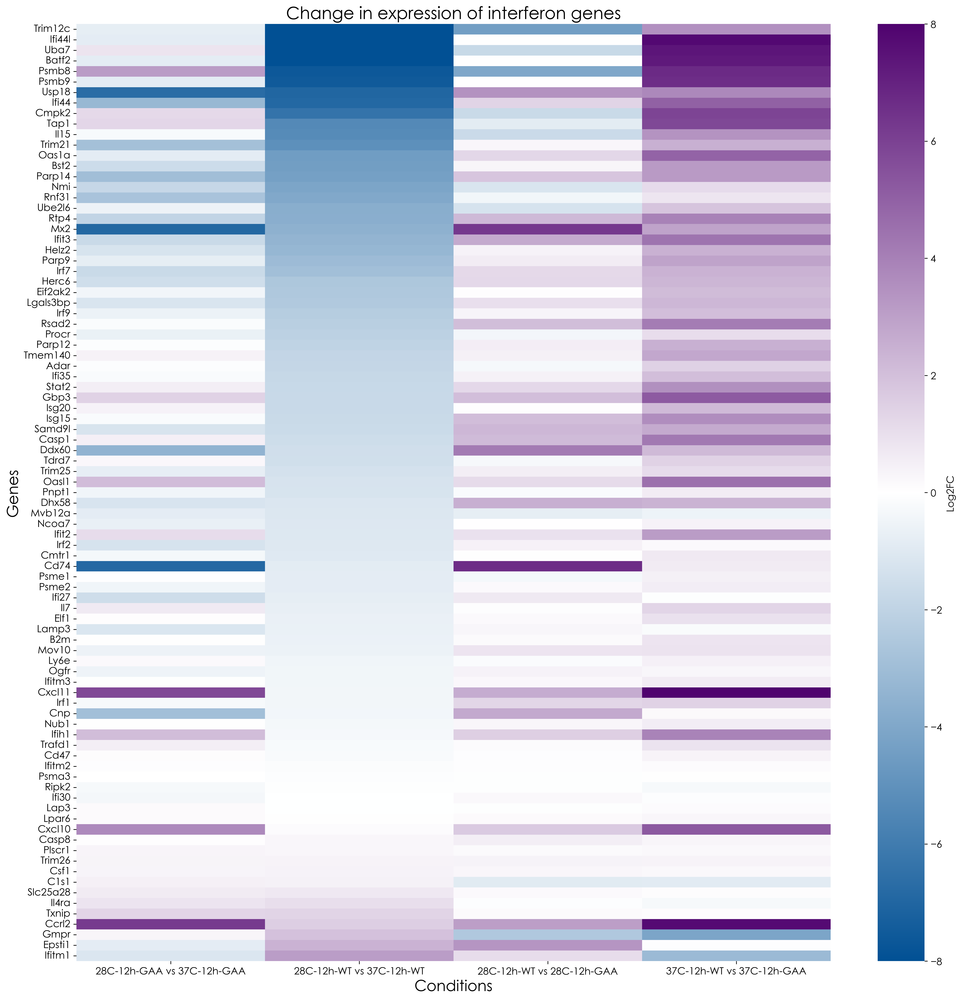

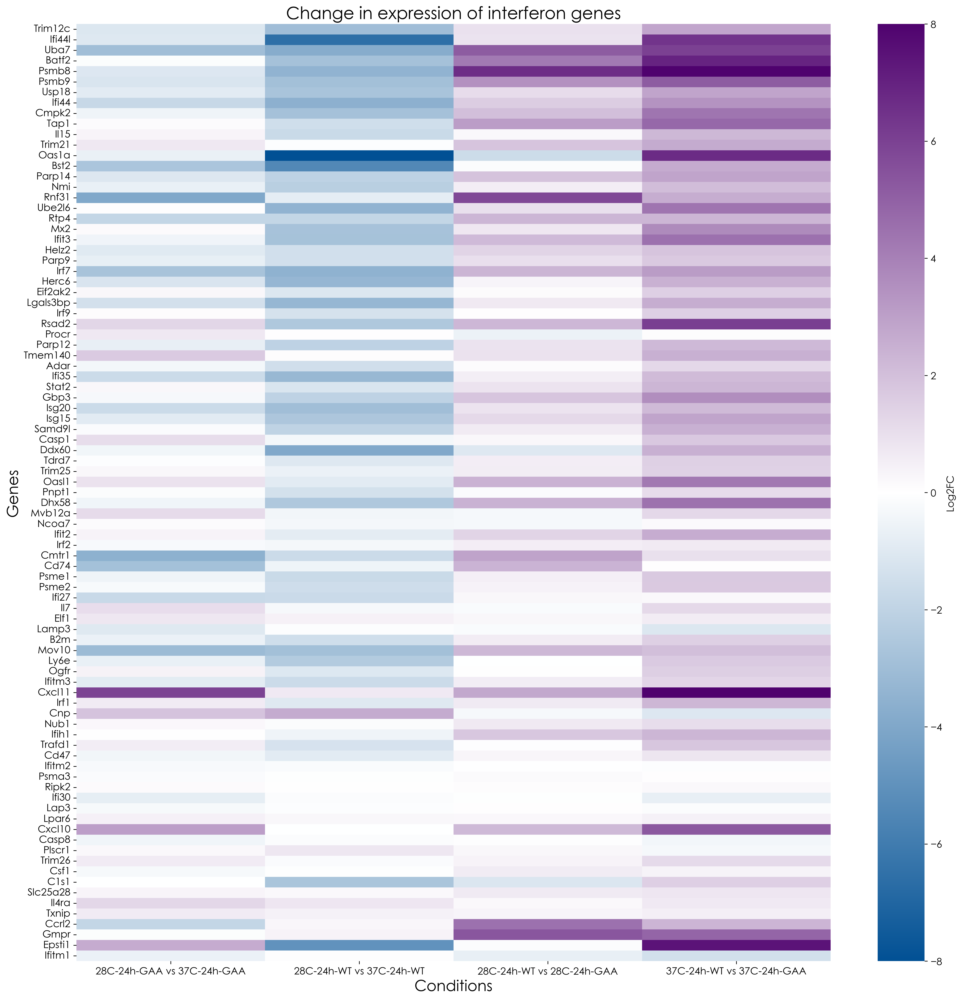

In [56]:

import matplotlib as mpl
cmapy = mpl.colors.LinearSegmentedColormap.from_list('my_cmap', ["#015094",'white',"#4f026e" ], 11000)

vmin_value = -8  # Replace with your desired minimum value
vmax_value = 8
fig,ax = plt.subplots(1,1, figsize = (20,20),dpi = 300)
ff.sort_values('28C-12h-WT vs 37C-12h-WT', inplace=True)

h12 = ff.filter(like='12', axis=1)
sns.heatmap(h12, cmap=cmapy, annot=False, linewidths=0.00000001, cbar=True, vmin=vmin_value, vmax=vmax_value,ax=ax,cbar_kws={'label': 'Log2FC'})
ax.set_xlabel('Conditions', fontsize=18)  # Adjust fontsize as needed
ax.set_ylabel('Genes', fontsize=18)  # Adjust fontsize as needed
ax.set_title('Change in expression of interferon genes', fontsize=20)
filename = r'E:\transfer\JC\plots\sexyplots\\12h.png'
plt.savefig(filename, dpi = 600, bbox_inches = 'tight', facecolor = 'white')

fig,ax = plt.subplots(1,1, figsize = (20,20),dpi = 300)
h24 = ff.filter(like='24', axis=1)
sns.heatmap(h24, cmap=cmapy, annot=False, linewidths=0.00000001, cbar=True, vmin=vmin_value, vmax=vmax_value,ax=ax,cbar_kws={'label': 'Log2FC'})
ax.set_xlabel('Conditions', fontsize=18)  # Adjust fontsize as needed
ax.set_ylabel('Genes', fontsize=18)  # Adjust fontsize as needed
ax.set_title('Change in expression of interferon genes', fontsize=20)
filename = r'E:\transfer\JC\plots\sexyplots\\24h.png'
plt.savefig(filename, dpi = 600, bbox_inches = 'tight', facecolor = 'white')


28C-12h-GAA vs 37C-12h-GAA
28C-12h-WT vs 37C-12h-WT
28C-12h-WT vs 28C-12h-GAA
37C-12h-WT vs 37C-12h-GAA


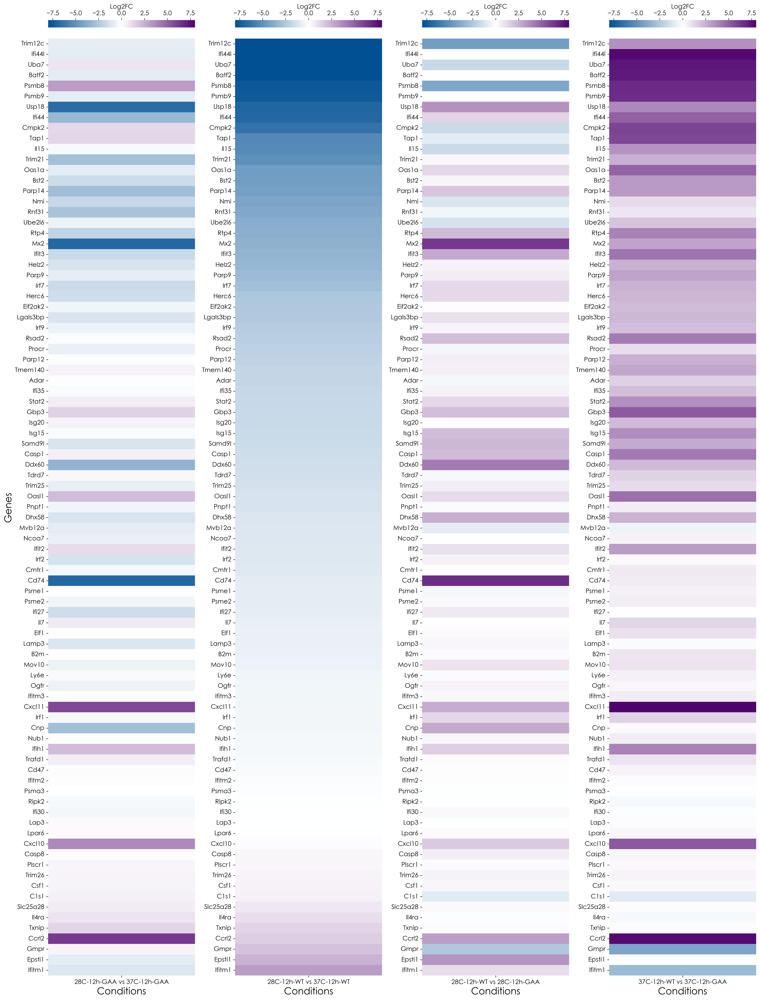

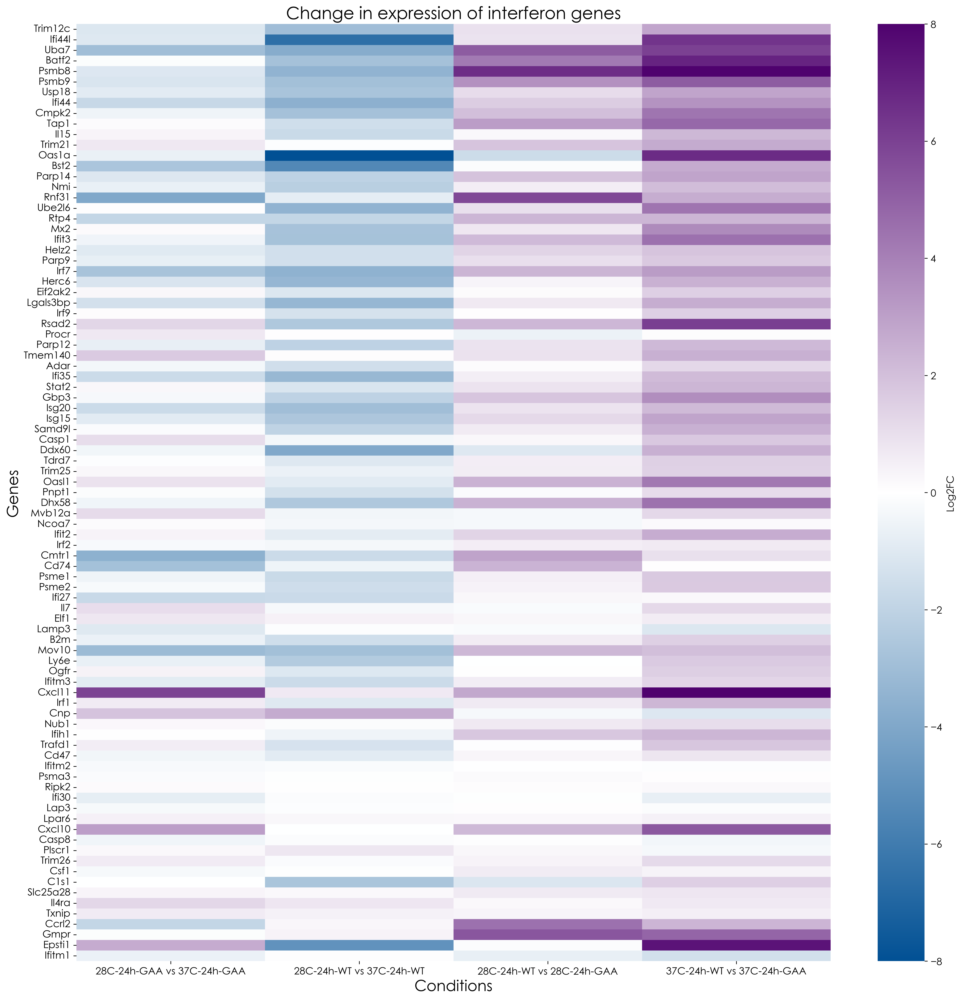

In [96]:
import matplotlib as mpl
cmapy = mpl.colors.LinearSegmentedColormap.from_list('my_cmap', ["#015094",'white',"#4f026e" ], 11000)

vmin_value = -8  # Replace with your desired minimum value
vmax_value = 8
fig,axs = plt.subplots(1,4, figsize = (20,30),dpi = 300)
ax = axs.flatten()
ff.sort_values('28C-12h-WT vs 37C-12h-WT', inplace=True)
jj=0
h12 = ff.filter(like='12', axis=1)

for ax,cond in zip(axs,ff.columns):
    print(cond)
    sns.heatmap(h12[cond].to_frame(), cmap=cmapy, annot=False, linewidths=0.00000001, cbar=True, vmin=vmin_value, vmax=vmax_value,ax=ax,cbar_kws={'label': 'Log2FC',"shrink":1,"orientation": "horizontal","location" : "top","pad":0.01})
    ax.set_xlabel('Conditions', fontsize=18)  # Adjust fontsize as needed
    if jj==0:
        ax.set_ylabel('Genes', fontsize=18) 
    else:
        ax.set_ylabel(None)# Adjust fontsize as needed
    jj+=1
# ax.set_title('Change in expression of interferon genes', fontsize=20)
fig.tight_layout()
filename = r'E:\transfer\JC\plots\sexyplots\\12h.png'
# plt.savefig(filename, dpi = 600, bbox_inches = 'tight', facecolor = 'white')

fig,ax = plt.subplots(1,1, figsize = (20,20),dpi = 300)
h24 = ff.filter(like='24', axis=1)
sns.heatmap(h24, cmap=cmapy, annot=False, linewidths=0.00000001, cbar=True, vmin=vmin_value, vmax=vmax_value,ax=ax,cbar_kws={'label': 'Log2FC'})
ax.set_xlabel('Conditions', fontsize=18)  # Adjust fontsize as needed
ax.set_ylabel('Genes', fontsize=18)  # Adjust fontsize as needed
ax.set_title('Change in expression of interferon genes', fontsize=20)
filename = r'E:\transfer\JC\plots\sexyplots\\24h.png'
# plt.savefig(filename, dpi = 600, bbox_inches = 'tight', facecolor = 'white')


In [75]:
np.shape(np.asarray(h12[cond]).reshape(len(h12[cond]),1))

(89, 1)

In [744]:
stat_res_WT = DeseqStats(dds, n_cpus=16, contrast = ('condition','28C-12h-WT','37C-12h-WT'))

In [745]:
stat_res_WT.summary()

Running Wald tests...


Log2 fold change & Wald test p-value: condition 28C-12h-WT vs 37C-12h-WT


... done in 3.75 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_id,,,,,,
CHIKV-SGc,2085.921677,0.721934,0.448191,1.610774,0.107229,0.365192
CHIKV-SGv,118561.097281,0.933129,0.591694,1.577048,0.114785,0.378193
ENSMUSG00000000001,2424.691841,0.095568,0.149685,0.638462,0.523173,0.795721
ENSMUSG00000000028,288.282649,-0.303686,0.264211,-1.149404,0.250390,0.571740
ENSMUSG00000000031,6.155494,-2.508112,2.623176,-0.956136,0.339004,NaN
...,...,...,...,...,...,...
ENSMUSG00002076867,0.389496,0.843144,7.222789,0.116734,0.907071,NaN
ENSMUSG00002076935,0.512486,-0.969404,7.592425,-0.127680,0.898402,NaN
ENSMUSG00002076975,1.502255,-3.111091,5.479891,-0.567729,0.570219,NaN


In [457]:
lis = metadata["condition"].unique()

rest = list(combinations(lis, 2))
print(len(rest))

66


In [746]:
res_WT = stat_res_WT.results_df

In [747]:
mapper = id_map(species = 'mouse', key = 'ensembl')
res_WT['symbol'] = res_WT.index.map(mapper.mapper) 
res_WT["symbol"][0] = "CHIKV-SGc"
res_WT["symbol"][1] = "CHIKV-SGv"

In [748]:
res = res_WT[res_WT.baseMean >= 10]

In [623]:
res.loc[res["symbol"] == "Bst2"]

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,symbol
gene_id,,,,,,,
ENSMUSG00000046718,208.26745,5.433471,1.194826,4.547499,0.000005,0.000197,Bst2


In [648]:
sigs = res[(res.padj < 0.05) & (abs(res.log2FoldChange) > 0.5)]

In [749]:
ranking = res[['symbol', 'stat']].dropna().sort_values('stat', ascending = True)
ranking = ranking.drop_duplicates('symbol')
ranking.set_index("symbol", inplace= True)

2024-04-17 23:22:40,302 [INFO] Parsing data files for GSEA.............................
2024-04-17 23:22:40,303 [INFO] 0000 gene_sets have been filtered out when max_size=100 and min_size=5
2024-04-17 23:22:40,304 [INFO] 0001 gene_sets used for further statistical testing.....
2024-04-17 23:22:40,304 [INFO] Start to run GSEA...Might take a while..................
2024-04-17 23:22:40,671 [INFO] Congratulations. GSEApy runs successfully................



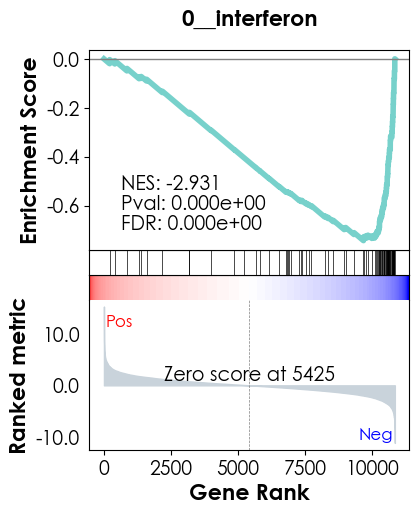

In [750]:
# infer = pd.read_csv(r"E:\transfer\JC\interferon_genes.csv",low_memory =False)
# interferon ={"Interferon" :[x for x in infer]}
pre_res = gp.prerank(rnk = ranking,
                     gene_sets = [interferon],
                     hreads=4,
                     min_size=5,
                     max_size=100,
                     permutation_num=1000, # reduce number to speed up testing
                     outdir=None, # don't write to disk
                     seed=6,
                     verbose=True)

out = []

for term in list(pre_res.results):
    out.append([term,
               pre_res.results[term]['fdr'],
               pre_res.results[term]['es'],
               pre_res.results[term]['nes']])

out_df = pd.DataFrame(out, columns = ['Term','fdr', 'es', 'nes']).sort_values('fdr').reset_index(drop = True)
out_df.sort_values('nes').iloc[0].Term
terms = pre_res.res2d.Term
axs = pre_res.plot(terms=terms[0],colors = "#77d1cb" )


In [715]:
######## For heatmap #########

fadu = crowd.copy()
# fadu.append(hukkah)
goo = []
concatenated_df = pd.DataFrame()
titles = ["37 vs 28°C Mock","37 vs 28°C WT","WT vs M @ 28°C","WT vs M @ 37°C"]
for foo,comp in zip(fadu,titles):
    foo.rename(columns = {'fc':comp}, inplace = True)
    goo.append(foo)
concatenated_df = pd.concat(goo, axis=1)

# Identify and remove non-unique columns
unique_columns = ['pv','gene_name']
final_df = concatenated_df.drop(unique_columns, axis=1)
final_df['gene_name']= goo[0]['gene_name']
final_df = final_df[['gene_name'] + [col for col in final_df.columns if col != 'gene_name']]  

cmapi = matplotlib.colors.LinearSegmentedColormap.from_list("", ["#094dd6",'white',"#c40d00"])
# Create a DataFrame from your data
df = final_df

# # Set 'GeneName' as the index
df.set_index('gene_name', inplace=True)
df.T
vmin_value = -6  # Replace with your desired minimum value
vmax_value = 6 
# Create a heatmap
fig,ax = plt.subplots(1,1, figsize = (20,20),dpi = 300)
sns.heatmap(df, cmap=cmapi, annot=False, fmt='6f', linewidths=0.00000001, cbar=True, ax = ax,vmin=vmin_value, vmax=vmax_value,cbar_kws={'label': 'Log2FC'})
ax.set_xlabel('Conditions', fontsize=18)  # Adjust fontsize as needed
ax.set_ylabel('Genes', fontsize=18)  # Adjust fontsize as needed
ax.set_title('Change in expression of interferon genes: mock', fontsize=20)

# Show the heatmap
plt.show()
fig.savefig(str(outpath) + f'{"Interferon1"}.png')

{'IL2-STAT5': ['ABCB1',
  'ADAM19',
  'AGER',
  'AHCY',
  'AHNAK',
  'AHR',
  'ALCAM',
  'AMACR',
  'ANXA4',
  'APLP1',
  'ARL4A',
  'BATF',
  'BATF3',
  'BCL2',
  'BCL2L1',
  'BHLHE40',
  'BMP2',
  'BMPR2',
  'CA2',
  'CAPG',
  'CAPN3',
  'CASP3',
  'CCND2',
  'CCND3',
  'CCNE1',
  'CCR4',
  'CD44',
  'CD48',
  'CD79B',
  'CD81',
  'CD83',
  'CD86',
  'CDC42SE2',
  'CDC6',
  'CDCP1',
  'CDKN1C',
  'CISH',
  'CKAP4',
  'COCH',
  'COL6A1',
  'CSF1',
  'CSF2',
  'CST7',
  'CTLA4',
  'CTSZ',
  'CXCL10',
  'CYFIP1',
  'DCPS',
  'DENND5A',
  'DHRS3',
  'DRC1',
  'ECM1',
  'EEF1AKMT1',
  'EMP1',
  'ENO3',
  'ENPP1',
  'EOMES',
  'ETFBKMT',
  'ETV4',
  'F2RL2',
  'FAH',
  'FGL2',
  'FLT3LG',
  'FURIN',
  'GABARAPL1',
  'GADD45B',
  'GALM',
  'GATA1',
  'GBP4',
  'GLIPR2',
  'GPR65',
  'GPR83',
  'GPX4',
  'GSTO1',
  'GUCY1B1',
  'HIPK2',
  'HK2',
  'HOPX',
  'HUWE1',
  'HYCC2',
  'ICOS',
  'IFITM3',
  'IFNGR1',
  'IGF1R',
  'IGF2R',
  'IKZF2',
  'IKZF4',
  'IL10',
  'IL10RA',
  'IL13',
  'IL1

In [706]:
IL2 ={"IL2-STAT5" :[x for x in genesets[0]['HALLMARK_IL2_STAT5_SIGNALING']["geneSymbols"]]}
# genesets[0]['HALLMARK_IL2_STAT5_SIGNALING']["geneSymbols"]

In [657]:
import matplotlib.pyplot as plt
import gseapy as gp

# Assuming 'pre_rank' is your prerank object
# pre = gp.prerank(rnk=pre_res, gene_sets='KEGG_2016', 
#                  processes=4, permutation_num=100)

# # Plot the SGEA
# pre_res = pre.run()

# # Define custom colors
colors = ['#E69F00', '#56B4E9', '#F0E442', '#009E73', '#D55E00']

# Create the plot
colors = ['#E69F00', '#56B4E9', '#F0E442', '#009E73', '#D55E00']
cmap = sns.color_palette(colors)

# Create the plot
pre_res.plot(cmap=cmap)

plt.show()

plt.show()

TypeError: GSEAbase.plot() got an unexpected keyword argument 'cmap'

In [742]:
import matplotlib as mpl
cmapx = mpl.colors.LinearSegmentedColormap.from_list('my_cmap', ["#015094",'white',"#4f026e" ], 1100)

In [751]:
from gseapy.plot import gseaplot
fig=gseaplot(rank_metric=pre_res.ranking, term=terms[0], ofname='12h.svg', **pre_res.results[terms[0]],cmap=cmapx,colors = ["#77d1cb"])


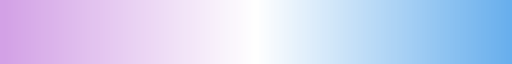

In [733]:
cmap

In [166]:
gp.get_library_name() #to look at available libraries

['ARCHS4_Cell-lines',
 'ARCHS4_IDG_Coexp',
 'ARCHS4_Kinases_Coexp',
 'ARCHS4_TFs_Coexp',
 'ARCHS4_Tissues',
 'Achilles_fitness_decrease',
 'Achilles_fitness_increase',
 'Aging_Perturbations_from_GEO_down',
 'Aging_Perturbations_from_GEO_up',
 'Allen_Brain_Atlas_10x_scRNA_2021',
 'Allen_Brain_Atlas_down',
 'Allen_Brain_Atlas_up',
 'Azimuth_2023',
 'Azimuth_Cell_Types_2021',
 'BioCarta_2013',
 'BioCarta_2015',
 'BioCarta_2016',
 'BioPlanet_2019',
 'BioPlex_2017',
 'CCLE_Proteomics_2020',
 'CORUM',
 'COVID-19_Related_Gene_Sets',
 'COVID-19_Related_Gene_Sets_2021',
 'Cancer_Cell_Line_Encyclopedia',
 'CellMarker_2024',
 'CellMarker_Augmented_2021',
 'ChEA_2013',
 'ChEA_2015',
 'ChEA_2016',
 'ChEA_2022',
 'Chromosome_Location',
 'Chromosome_Location_hg19',
 'ClinVar_2019',
 'DSigDB',
 'Data_Acquisition_Method_Most_Popular_Genes',
 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019',
 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019',
 'Descartes_Cell_Types_and_Tissue_2021',
 'Diabetes_Perturbatio

In [681]:
gene_sets= os.listdir(r"E:\transfer\JC\genesets\\")
gene_sets

['HALLMARK_IL2_STAT5_SIGNALING.v2023.2.Hs.json',
 'HALLMARK_IL6_JAK_STAT3_SIGNALING.v2023.2.Hs.json',
 'HALLMARK_INFLAMMATORY_RESPONSE.v2023.2.Mm.json',
 'HALLMARK_INTERFERON_ALPHA_RESPONSE.v2023.2.Mm.json',
 'HALLMARK_INTERFERON_GAMMA_RESPONSE.v2023.2.Mm.json']

In [686]:
import json
genesets=[]
for file in gene_sets:
    with open(r"E:\transfer\JC\genesets\\"+file) as f:
       genesets.append(json.load(f))
    
    print(genesets)

[{'HALLMARK_IL2_STAT5_SIGNALING': {'systematicName': 'M5947', 'pmid': '26771021', 'exactSource': '', 'geneSymbols': ['ABCB1', 'ADAM19', 'AGER', 'AHCY', 'AHNAK', 'AHR', 'ALCAM', 'AMACR', 'ANXA4', 'APLP1', 'ARL4A', 'BATF', 'BATF3', 'BCL2', 'BCL2L1', 'BHLHE40', 'BMP2', 'BMPR2', 'CA2', 'CAPG', 'CAPN3', 'CASP3', 'CCND2', 'CCND3', 'CCNE1', 'CCR4', 'CD44', 'CD48', 'CD79B', 'CD81', 'CD83', 'CD86', 'CDC42SE2', 'CDC6', 'CDCP1', 'CDKN1C', 'CISH', 'CKAP4', 'COCH', 'COL6A1', 'CSF1', 'CSF2', 'CST7', 'CTLA4', 'CTSZ', 'CXCL10', 'CYFIP1', 'DCPS', 'DENND5A', 'DHRS3', 'DRC1', 'ECM1', 'EEF1AKMT1', 'EMP1', 'ENO3', 'ENPP1', 'EOMES', 'ETFBKMT', 'ETV4', 'F2RL2', 'FAH', 'FGL2', 'FLT3LG', 'FURIN', 'GABARAPL1', 'GADD45B', 'GALM', 'GATA1', 'GBP4', 'GLIPR2', 'GPR65', 'GPR83', 'GPX4', 'GSTO1', 'GUCY1B1', 'HIPK2', 'HK2', 'HOPX', 'HUWE1', 'HYCC2', 'ICOS', 'IFITM3', 'IFNGR1', 'IGF1R', 'IGF2R', 'IKZF2', 'IKZF4', 'IL10', 'IL10RA', 'IL13', 'IL18R1', 'IL1R2', 'IL1RL1', 'IL2RA', 'IL2RB', 'IL3RA', 'IL4R', 'IRF4', 'IRF6', 'I

In [625]:
out_df.sort_values('nes').iloc[0].Term
terms = pre_res.res2d.Term

ValueError: could not convert string to float: 'CHIKV-SGc'

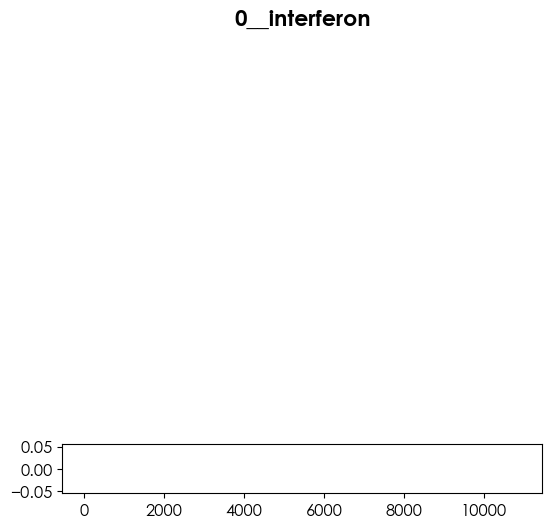

In [720]:
terms = pre_res.res2d.Term
axs = gseaplot(term=terms[0],hits = sigs,nes= out_df["nes"],pval= out_df["fdr"],fdr = out_df["fdr"],RES= res)

In [205]:
gseaplot(pre_res.ranking)

TypeError: gseaplot() missing 5 required positional arguments: 'hits', 'nes', 'pval', 'fdr', and 'RES'

In [207]:
dds.layers['normed_counts']

array([[2.41364570e+03, 7.84249613e+04, 2.92397523e+03, ...,
        0.00000000e+00, 5.37389045e+05, 1.96886248e+05],
       [2.12772627e+03, 8.44904638e+04, 3.18625676e+03, ...,
        0.00000000e+00, 5.08774547e+05, 2.02184656e+05],
       [1.13026768e+03, 2.38576839e+02, 3.35672065e+03, ...,
        3.96307042e+00, 5.64221543e+05, 1.99955133e+05],
       ...,
       [8.52879045e+02, 4.30138637e+04, 1.23469118e+03, ...,
        0.00000000e+00, 4.67499698e+05, 1.80848043e+05],
       [6.16286270e+02, 1.45836318e+04, 1.56741236e+03, ...,
        1.08596700e+01, 4.47317950e+05, 1.82118475e+05],
       [3.34530011e+02, 1.16807391e+02, 1.51690687e+03, ...,
        0.00000000e+00, 4.37123453e+05, 1.95273352e+05]])

In [209]:
dds.layers['log1p']

array([[ 7.78930785, 11.26991029,  7.98104129, ...,  0.        ,
        13.19447945, 12.1903865 ],
       [ 7.66327909, 11.34440579,  8.06691588, ...,  0.        ,
        13.13976223, 12.21694164],
       [ 7.03109413,  5.4788742 ,  8.11901764, ...,  1.60202459,
        13.24320403, 12.20585329],
       ...,
       [ 6.74978955, 10.669301  ,  7.11938575, ...,  0.        ,
        13.05515612, 12.10541794],
       [ 6.42533289,  9.58772364,  7.35781915, ...,  2.47314357,
        13.01102715, 12.11241821],
       [ 5.8157114 ,  4.76905101,  7.3250876 , ...,  0.        ,
        12.98797322, 12.18216078]])

In [210]:
sigs

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,symbol
gene_id,,,,,,,
CHIKV-SGc,2085.921677,-3.221765,0.447950,-7.192236,6.373876e-13,1.246201e-10,CHIKV-SGc
CHIKV-SGv,118561.097281,-4.571677,0.591693,-7.726436,1.105995e-14,3.687322e-12,CHIKV-SGv
ENSMUSG00000000001,2424.691841,-0.949137,0.149335,-6.355767,2.073894e-10,2.716308e-08,Gnai3
ENSMUSG00000000127,216.161437,1.132567,0.290872,3.893700,9.872668e-05,2.105021e-03,Fer
ENSMUSG00000000278,651.796937,0.704309,0.199385,3.532403,4.118014e-04,6.257789e-03,Scpep1
...,...,...,...,...,...,...,...
ENSMUSG00000116739,18.469607,-3.960523,1.296490,-3.054804,2.252076e-03,2.337485e-02,NaN
ENSMUSG00000117869,588.767915,-0.578220,0.210774,-2.743321,6.082121e-03,4.838430e-02,NaN
ENSMUSG00000118423,10.720753,-6.893506,2.491572,-2.766730,5.662168e-03,4.607631e-02,NaN


In [211]:
dds_sigs = dds[:, sigs.index]
dds_sigs

View of AnnData object with n_obs × n_vars = 36 × 1268
    obs: 'condition', 'batch'
    uns: 'trend_coeffs', '_squared_logres', 'prior_disp_var', 'pca', 'condition_colors', 'batch_colors'
    obsm: 'design_matrix', 'size_factors', 'replaceable', 'X_pca'
    varm: 'non_zero', '_rough_dispersions', 'genewise_dispersions', '_genewise_converged', '_normed_means', 'fitted_dispersions', 'MAP_dispersions', '_MAP_converged', 'dispersions', '_outlier_genes', 'LFC', '_LFC_converged', 'replaced', 'PCs'
    layers: 'normed_counts', '_mu_hat', '_mu_LFC', '_hat_diagonals', 'cooks', 'replace_cooks', 'log1p'

In [212]:
grapher = pd.DataFrame(dds_sigs.layers['log1p'].T,
                       index=dds_sigs.var_names, columns=dds_sigs.obs_names)

C:\Users\cheta\AppData\Roaming\Python\Python311\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
C:\Users\cheta\AppData\Roaming\Python\Python311\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


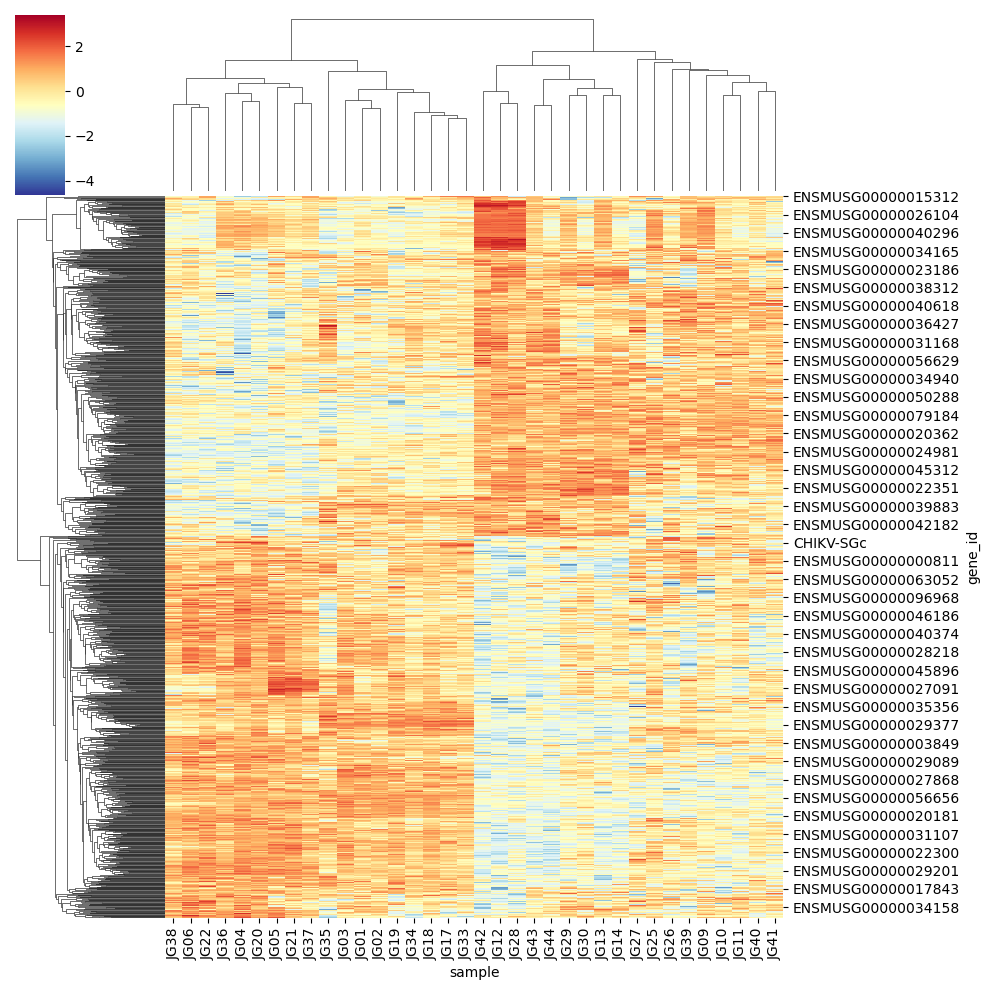

In [213]:
sns.clustermap(grapher, z_score=0, cmap = 'RdYlBu_r')

In [215]:
sigs[sigs.symbol.isin(infer)].index

Index(['ENSMUSG00000002227', 'ENSMUSG00000010358', 'ENSMUSG00000020464',
       'ENSMUSG00000020638', 'ENSMUSG00000020641', 'ENSMUSG00000022216',
       'ENSMUSG00000022587', 'ENSMUSG00000023341', 'ENSMUSG00000024079',
       'ENSMUSG00000025492', 'ENSMUSG00000025498', 'ENSMUSG00000026946',
       'ENSMUSG00000027078', 'ENSMUSG00000028037', 'ENSMUSG00000029798',
       'ENSMUSG00000032596', 'ENSMUSG00000033355', 'ENSMUSG00000033880',
       'ENSMUSG00000035517', 'ENSMUSG00000035692', 'ENSMUSG00000038507',
       'ENSMUSG00000038521', 'ENSMUSG00000039146', 'ENSMUSG00000039236',
       'ENSMUSG00000040033', 'ENSMUSG00000046718', 'ENSMUSG00000047735',
       'ENSMUSG00000055447', 'ENSMUSG00000060802', 'ENSMUSG00000064215',
       'ENSMUSG00000074896', 'ENSMUSG00000079197'],
      dtype='object', name='gene_id')

In [216]:
dds_sub = dds[:, sigs[sigs.symbol.isin(infer)].index]

In [218]:
grapher = pd.DataFrame(dds_sub.layers['log1p'].T,
                       index=dds_sub.var_names, columns=dds_sub.obs_names)

In [219]:
grapher.index = grapher.index.map(mapper.mapper)

In [220]:
grapher

sample,JG01,JG02,JG03,JG04,JG05,JG06,JG09,JG10,JG11,JG12,JG13,JG14,JG17,JG18,JG19,JG20,JG21,JG22,JG25,JG26,JG27,JG28,JG29,JG30,JG33,JG34,JG35,JG36,JG37,JG38,JG39,JG40,JG41,JG42,JG43,JG44
gene_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Mov10,3.452024,2.197110,1.217237,3.358649,1.350848,2.061942,3.270417,2.924450,3.611284,5.565958,3.766429,4.258961,3.301522,3.500150,0.763985,2.866782,2.181715,1.605851,3.898753,2.757450,4.877238,5.310582,4.389950,2.308982,3.084378,1.224447,3.892191,4.106176,2.451729,3.028163,4.032446,3.701447,2.799569,5.497051,4.012743,4.117250
Ifi35,1.329344,2.197110,1.428025,3.126929,3.045707,3.071937,4.771665,3.488083,3.347757,5.676605,4.630538,2.715577,4.110878,2.328789,2.766858,3.321894,2.816784,2.961019,3.973255,2.324812,4.079559,5.413708,1.690879,1.531621,2.552252,3.986207,3.693189,3.554641,3.100848,2.993587,4.830493,3.392209,1.580913,5.544677,4.344035,3.440261
Pnpt1,5.778622,5.900986,5.791662,6.327885,6.383057,6.147534,6.578585,6.270127,6.150978,7.036031,6.362342,6.048718,5.359127,5.890917,5.653926,5.823442,6.144482,6.041951,6.671678,5.709523,5.760952,7.045205,6.386625,6.039695,5.482876,5.172565,5.223006,5.840180,5.827486,5.713436,5.927767,5.953982,6.170192,6.811711,5.861425,5.648553
Cmpk2,0.000000,0.000000,0.000000,4.079968,3.045707,0.000000,4.060015,0.000000,0.000000,5.861843,2.958012,0.000000,0.000000,2.544456,0.000000,3.608864,2.440779,0.000000,4.911519,1.877150,0.000000,6.221287,4.030749,0.000000,1.180030,0.000000,0.000000,4.471439,2.738644,0.000000,4.084180,0.000000,0.000000,6.326754,2.213180,0.000000
Rsad2,3.145380,2.291296,0.000000,4.930366,3.388010,0.000000,5.709441,2.924450,0.000000,6.479950,3.015577,0.000000,4.702580,3.402260,0.000000,4.993555,2.104910,0.000000,5.690811,3.058447,0.000000,6.405896,2.658351,0.000000,4.253127,2.198070,0.000000,4.941569,4.024830,0.000000,5.659402,2.562753,2.629341,7.120990,0.644468,0.000000
Psme1,5.270809,5.205709,5.309870,5.534953,5.639594,5.077252,5.899920,5.488363,5.583334,7.084047,6.193273,5.683781,4.881056,5.307042,5.587476,5.611867,5.170019,5.081903,5.757285,5.672145,5.045468,6.875098,5.609805,5.493117,5.281046,5.580677,5.092188,6.088182,5.456964,5.268281,5.572233,4.957681,4.760306,6.939630,5.433954,5.713571
Ly6e,7.180381,7.369332,7.322053,7.465821,7.480542,7.490113,7.817694,7.524395,7.491702,9.257622,8.271509,7.692140,7.197727,7.486782,7.281293,7.433782,7.473818,7.264716,7.507369,7.097915,6.995070,9.081362,7.808724,7.645493,7.568910,7.442271,7.322228,7.699541,7.682452,7.663132,7.581167,7.308306,7.568961,9.237201,7.983202,8.010019
Mx2,3.327172,0.000000,0.000000,3.948849,4.135247,0.000000,4.909155,2.085621,2.259119,6.037033,4.525024,0.000000,1.967654,0.000000,0.000000,4.138612,3.953159,0.000000,5.114254,3.141537,0.000000,5.686447,3.140751,0.000000,1.803780,0.000000,0.000000,4.447620,2.961327,0.000000,4.386453,2.942185,0.000000,6.491485,2.949660,0.584787
Eif2ak2,5.688763,5.762971,5.478874,7.383902,7.306527,6.051786,7.614987,6.111465,6.109940,8.099369,7.128673,6.235862,5.202742,5.279100,5.704843,7.190998,6.880594,5.616656,7.318853,5.344626,5.426997,8.031609,7.097399,5.868156,5.813120,5.583691,5.391849,7.271903,7.349004,5.706458,6.986588,6.020105,6.120564,8.026319,6.726808,6.148959


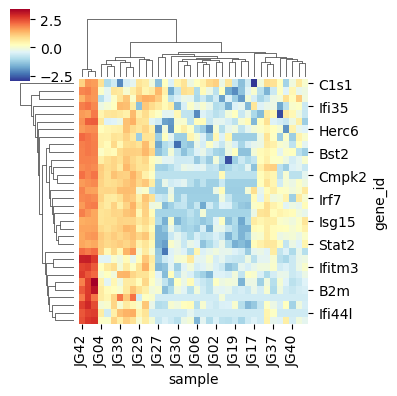

In [221]:
ax = sns.clustermap(grapher, z_score=0, cmap = 'RdYlBu_r', figsize=(4,4))

In [222]:
#volcano
from sanbomics.plots import volcano

In [228]:
df  = res

In [296]:
ISG = infer
df['nlog10'] = -np.log10(df.padj)


df['Expression'] = df[['log2FoldChange', 'symbol', 'nlog10']].apply(map_color, axis = 1)

In [301]:
def map_shape(symbol):
    if symbol in ISG:
        return 'ISG'
    
    return 'Rest'

df['Expression'] = df[['log2FoldChange', 'symbol', 'nlog10']].apply(map_color, axis = 1)
df['Gene Type'] = df.symbol.map(map_shape)

df = df.sort_values('Gene Type',ascending=False)
print(df.head(50))

                         baseMean  log2FoldChange     lfcSE      stat  ...  color  shape       Expression  Gene Type
gene_id                                                                ...                                          
ENSMUSG00000059586    1266.557511       -0.055669  0.160947 -0.345886  ...     NS   Rest  Not Significant       Rest
ENSMUSG00000000435      47.888562        0.796318  0.635551  1.252957  ...     NS   Rest  Not Significant       Rest
ENSMUSG00000000058     739.161292       -0.109080  0.243036 -0.448820  ...     NS   Rest  Not Significant       Rest
ENSMUSG00000000078    2369.589880       -0.175019  0.157545 -1.110914  ...     NS   Rest  Not Significant       Rest
ENSMUSG00000000374     198.945148        0.158337  0.304538  0.519925  ...     NS   Rest  Not Significant       Rest
ENSMUSG00000000378      83.543485        1.274373  0.636324  2.002709  ...     NS   Rest  Not Significant       Rest
ENSMUSG00000000384     279.047274       -0.572464  0.352896 -1.6

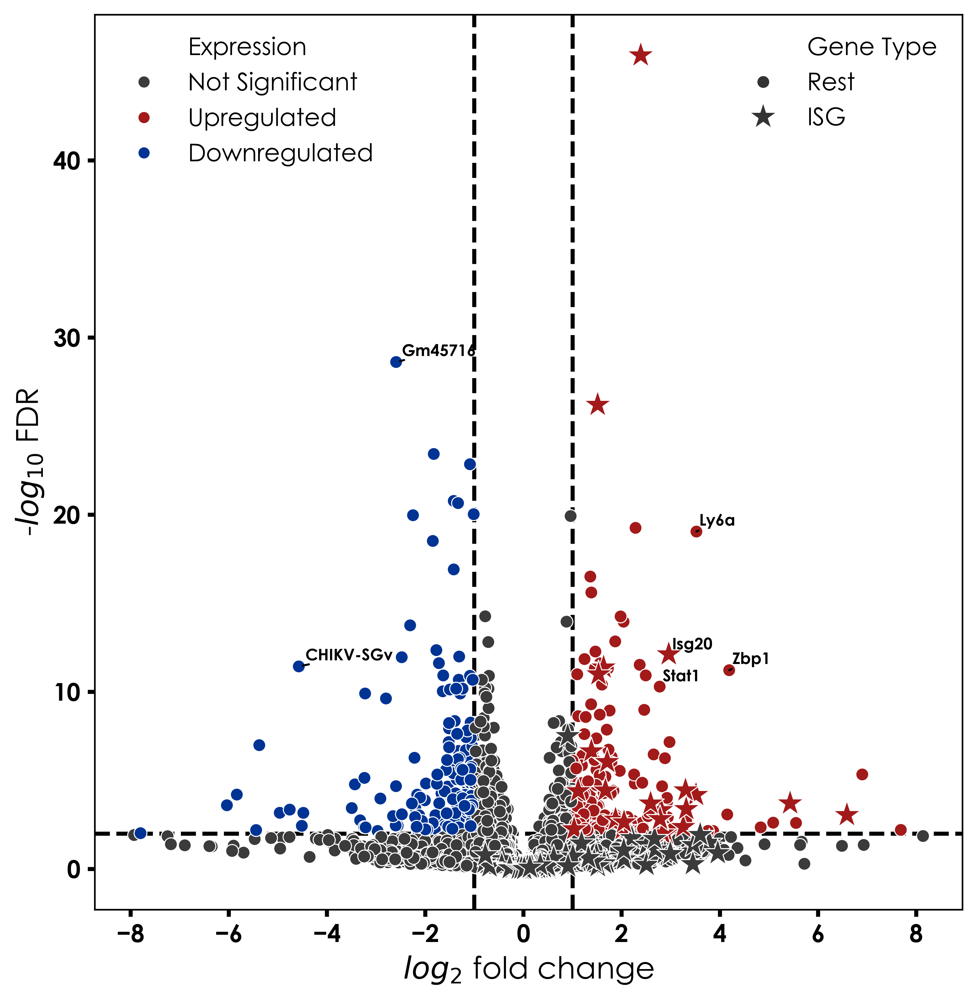

In [375]:
plt.figure(figsize = (7,7),dpi =600)

ax = sns.scatterplot(data = df, x = 'log2FoldChange', y = 'nlog10',
                    hue = 'Expression', hue_order = ['Not Significant', 'Upregulated',"Downregulated"],
                    palette = ['#3b3b3b', '#a31a1a', "#003494"],
                    style = 'Gene Type', style_order = [ 'Rest','ISG'],
                    markers = [  'o','*'], 
                    size = "Gene Type",size_order = [ 'Rest','ISG'],
                    sizes = [40,200], linewidths = 0.5,
                    alpha = 0.99999)
ax.set_facecolor('none')
ax.axhline(2, zorder = 0, c = 'k', lw = 2, ls = '--')
ax.axvline(1, zorder = 0, c = 'k', lw = 2, ls = '--')
ax.axvline(-1, zorder = 0, c = 'k', lw = 2, ls = '--')



texts = []
for i in range(len(df)):
    if df.iloc[i].nlog10 > 10 and abs(df.iloc[i].log2FoldChange) > 2.5:
        texts.append(plt.text(x = df.iloc[i].log2FoldChange, y = df.iloc[i].nlog10, s = df.iloc[i].symbol,
                             fontsize = 8, weight = 'bold'))
        
adjust_text(texts, arrowprops = dict(arrowstyle = '-', color = 'k'))

# Create legend
leg = ax.legend(loc = "upper center",ncol = 2, frameon = False, prop = {'weight':'regular'}, columnspacing=15)
leg._legend_box.align = "right"
# leg.set_alignment("right")
# legend1 = plt.legend(handles=[red_patch], loc='upper left')
# legend2 = plt.legend(handles=[blue_patch], loc='upper right')

# # Add the legends to the plot
# plt.gca().add_artist(legend1)
# plt.gca().add_artist(legend2)

# plt.show()

# for i, text in enumerate(leg.texts):
#     # print (text)
#     # if i >= len(leg.texts) / 2:  # Change this condition based on your legend structure
#     text.set_horizontalalignment('left')  # Change the alignment

# for axis in ['bottom', 'left']:
#     ax.spines[axis].set_linewidth(2)
    
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)

ax.tick_params(width = 2)

plt.xticks(size = 12, weight = 'bold')
plt.yticks(size = 12, weight = 'bold')

plt.xlabel("$log_{2}$ fold change", size = 15)
plt.ylabel("-$log_{10}$ FDR", size = 15)

# plt.savefig('volcano.png', dpi = 300, bbox_inches = 'tight', facecolor = 'white')
plt.tight_layout()
plt.show()

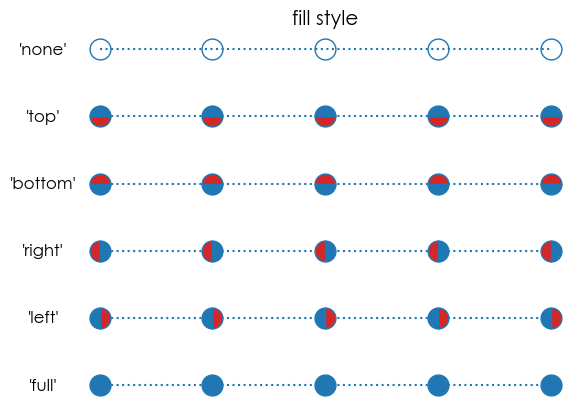

In [367]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D


points = np.ones(5)  # Draw 5 points for each line
marker_style = dict(color='tab:blue', linestyle=':', marker='o',
                    markersize=15, markerfacecoloralt='tab:red')

fig, ax = plt.subplots()

# Plot all fill styles.
for y, fill_style in enumerate(Line2D.fillStyles):
    ax.text(-0.5, y, repr(fill_style),
            horizontalalignment='center', verticalalignment='center')
    ax.plot(y * points, fillstyle=fill_style, **marker_style)

ax.set_axis_off()
ax.set_title('fill style')

plt.show()

In [347]:
leg.get_alignment()

'center'

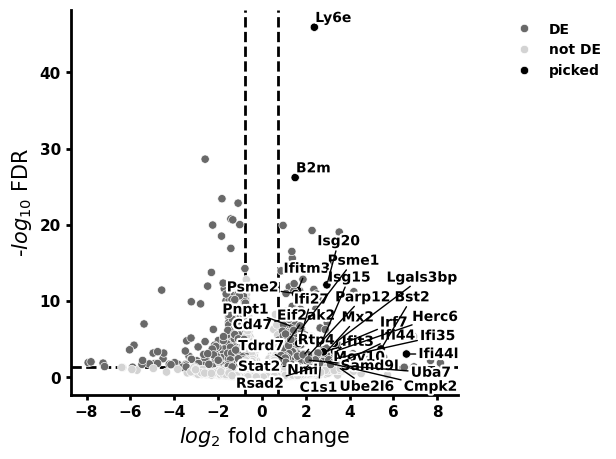

In [226]:
volcano(res, symbol='symbol', to_label = grapher.index)